<h1> Wildebeest Detection using U-Net from VHR satellite images</h1>
Code Author: Zijing Wu 

***The code is developed for educational project purposes.***


In [1]:
#If you are using Google Colaboratory to run this code, please upload the whole folder to your Google Drive, and run this cell install the requirements.

#connect to the google drive if you use Google Colaboratory
from google.colab import drive
drive.mount('/content/drive')
#install the libraries
!pip install rasterio
!pip install geopandas

Mounted at /content/drive
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 19.3 MB 1.2 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 7.5 MB/s 
     |████████████████████████████████| 16.7 MB 11.8 MB/s 
     |████████████████████████████████| 6.3 MB 44.2 MB/s 


# Load libraries and prepare the dataset

##Import libraries and modules

In [2]:
import tensorflow as tf
import tensorflow.keras
%matplotlib inline
%pylab inline
pylab.rcParams['figure.figsize'] = (15, 10)
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from skimage import exposure

from tensorflow.keras.models import *
from tensorflow.keras.layers import *

from tensorflow.keras import backend as K
epsilon = 1e-07
from tensorflow.keras.optimizers import SGD, Adadelta
from tensorflow.keras import regularizers

import os
import rasterio 
#import rasterio.warp             # Reproject raster samples
from rasterio import windows
#import geopandas as gps
#import PIL.Image
#import PIL.ImageDraw
import fiona 
import imageio
import gdal

from shapely.geometry import Point, MultiPoint
from shapely.geometry import mapping, shape
import numpy as np               # numerical array manipulation
#from tqdm import tqdm
import cv2
import random
from rasterio.windows import Window
from skimage import measure
from sklearn.cluster import KMeans
from fiona.crs import from_epsg

%matplotlib inline
%pylab inline
pylab.rcParams['figure.figsize'] = (15, 10)
import matplotlib.pyplot as plt
import gc

import pandas as pd

!pip install ipython-autotime
%load_ext autotime

Populating the interactive namespace from numpy and matplotlib
Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.7/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['minimum', 'subtract', 'dot', 'random', 'multiply', 'add', 'maximum', 'shape', 'average', 'concatenate']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 172 µs (started: 2022-07-26 03:53:10 +00:00)


In [3]:
#set the sys path where the modules locates
import sys
sys.path.insert(0,"core")

#If you are using Google Colaboratory, modify the path here
sys.path.insert(0,"/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/core")

#import modules
import data_generator
from data_generator import DataGenerator

import data_augmentation
from data_augmentation import *

import counting
from counting import *

import visualization
from visualization import *

import importlib

time: 2.67 s (started: 2022-07-26 03:53:10 +00:00)


##Define the path and load dataset of each year

In [4]:
#Year 2009 August

#Define File directories
Data_folder =  "/SampleData/"
#If you are using Google Colaboratory, modify the path here
Data_folder = "/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/SampleData"
Folder = "/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest"

#Training dataset
IMAGE_PATH = os.path.join(Data_folder, "data_2009Aug/3_Train_test/train/image")
LABEL_PATH = os.path.join(Data_folder, "data_2009Aug/3_Train_test/train/mask")

#Test dataset
TEST_IMAGE_PATH = os.path.join(Data_folder, "data_2009Aug/3_Train_test/test/image")
TEST_LABEL_PATH = os.path.join(Data_folder, "data_2009Aug/3_Train_test/test/mask")

#set the patch size of images that will be fed into the model
PATCHSIZE = 336
#Set the bands of the satellite image you will use. 
#The dataset provided is GeoEye-1 satellite image, which as 4 bands: R, G, B, NIR. 
#If you want to use RGB bands only, then change READ_CHANNEL = [1,2,3]
READ_CHANNEL = [1,2,3,4]
# READ_CHANNEL = [1,2,3]
NUMBER_BANDS = len(READ_CHANNEL)

#load the training and testing dataset
Data = DataGenerator(IMAGE_PATH, LABEL_PATH, TEST_IMAGE_PATH, TEST_LABEL_PATH, input_image_channel=READ_CHANNEL, patchsize=PATCHSIZE)
print(Data.image_list.keys())
print(Data.label_list.keys())
print(Data.test_image_list.keys())
print(Data.test_label_list.keys())

print(np.shape(Data.train_meta_list))
print(np.shape(Data.test_meta_list))

#use the class function to generate the patches
patches = Data.generate_patches()
Xtrain = patches['Xtrain']
Ytrain = patches['Ytrain']
Xtest = patches['Xtest']
Ytest = patches['Ytest']

print('Shape of Xtrain: ', np.shape(Xtrain))
print('Shape of Ytrain: ', np.shape(Ytrain))
print('Shape of Xtest: ', np.shape(Xtest))
print('Shape of Ytest: ', np.shape(Ytest))

#change the data type of testing dataset to float from int (required by U-Net model)
Xtest_int = Xtest.copy()
Xtest = np.float32(Xtest)
Ytest = np.float32(Ytest)

Xtrain_2009Aug = Xtrain
Ytrain_2009Aug = Ytrain

Xtest_2009Aug = Xtest
Ytest_2009Aug = Ytest

Ytrain_meta_2009Aug = Data.train_meta_list 
Ytest_meta_2009Aug = Data.test_meta_list

dict_keys(['ZP000', 'ZP001', 'ZP002', 'ZP003', 'ZP004', 'ZP005', 'ZP006', 'ZP007', 'ZP008', 'ZP009', 'ZP010', 'ZP011', 'ZP012', 'ZP013', 'ZP014', 'ZP015', 'ZP016', 'ZP017', 'ZP018', 'ZP019', 'ZP020', 'ZP021', 'ZP022', 'ZP023', 'ZP024', 'ZP025', 'ZP026', 'ZP027', 'ZP028', 'ZP029', 'ZP030', 'ZP031', 'ZP032', 'ZP033', 'ZP034', 'ZP035', 'ZP41', 'ZP42', 'ZP43', 'ZP44', 'ZP45', 'ZP46', 'ZP47', 'ZP48', 'ZP49', 'ZP50', 'ZP52', 'ZP53', 'ZP57', 'ZP58', 'ZP59', 'ZP60', 'ZP61', 'ZP62', 'ZP63', 'ZP64', 'ZP65', 'ZP66', 'ZP67', 'ZP68', 'ZP69', 'ZP72', 'ZP73', 'ZP74', 'ZP75', 'ZP76', 'ZP77', 'ZP81', 'ZP82', 'ZP83', 'ZP84', 'ZP85', 'ZP86', 'ZP87', 'ZP90', 'ZP91', 'ZP92'])
dict_keys(['ZP000', 'ZP001', 'ZP002', 'ZP003', 'ZP004', 'ZP005', 'ZP006', 'ZP007', 'ZP008', 'ZP009', 'ZP010', 'ZP011', 'ZP012', 'ZP013', 'ZP014', 'ZP015', 'ZP016', 'ZP017', 'ZP018', 'ZP019', 'ZP020', 'ZP021', 'ZP022', 'ZP023', 'ZP024', 'ZP025', 'ZP026', 'ZP027', 'ZP028', 'ZP029', 'ZP030', 'ZP031', 'ZP032', 'ZP033', 'ZP034', 'ZP035', '

In [5]:
# #Year 2010 September

# #Define File directories
# Data_folder =  "/SampleData/"

# #Training dataset
# IMAGE_PATH = os.path.join(Data_folder, "data_2010Sep/3_Train_test/train/image")
# LABEL_PATH = os.path.join(Data_folder, "data_2010Sep/3_Train_test/train/mask")

# #Test dataset
# TEST_IMAGE_PATH = os.path.join(Data_folder, "data_2010Sep/3_Train_test/test/image")
# TEST_LABEL_PATH = os.path.join(Data_folder, "data_2010Sep/3_Train_test/test/mask")

# #set the patch size of images that will be fed into the model
# PATCHSIZE = 336
# #Set the bands of the satellite image you will use. 
# #The dataset provided is GeoEye-1 satellite image, which as 4 bands: R, G, B, NIR. 
# #If you want to use RGB bands only, then change READ_CHANNEL = [1,2,3]
# READ_CHANNEL = [1,2,3,4]
# # READ_CHANNEL = [1,2,3]

# NUMBER_BANDS = len(READ_CHANNEL)

# #load the training and testing dataset
# Data = DataGenerator(IMAGE_PATH, LABEL_PATH, TEST_IMAGE_PATH, TEST_LABEL_PATH, input_image_channel=READ_CHANNEL, patchsize=PATCHSIZE)
# print(Data.image_list.keys())
# print(Data.label_list.keys())
# print(Data.test_image_list.keys())
# print(Data.test_label_list.keys())

# print(np.shape(Data.train_meta_list))
# print(np.shape(Data.test_meta_list))

# #use the class function to generate the patches
# patches = Data.generate_patches()
# Xtrain = patches['Xtrain']
# Ytrain = patches['Ytrain']
# Xtest = patches['Xtest']
# Ytest = patches['Ytest']

# print('Shape of Xtrain: ', np.shape(Xtrain))
# print('Shape of Ytrain: ', np.shape(Ytrain))
# print('Shape of Xtest: ', np.shape(Xtest))
# print('Shape of Ytest: ', np.shape(Ytest))

# #change the data type of testing dataset to float from int (required by U-Net model)
# Xtest_int = Xtest.copy()
# Xtest = np.float32(Xtest)
# Ytest = np.float32(Ytest)

# Xtrain_2010Sep = Xtrain
# Ytrain_2010Sep = Ytrain

# Xtest_2010Sep = Xtest
# Ytest_2010Sep = Ytest

# Ytrain_meta_2010Sep = Data.train_meta_list 
# Ytest_meta_2010Sep = Data.test_meta_list

time: 5.13 ms (started: 2022-07-26 03:54:41 +00:00)


In [ ]:
# # Year 2013 August
# #Define File directories
# Data_folder =  "/SampleData/"

# #Training dataset
# IMAGE_PATH = os.path.join(Data_folder, "data_2013Aug/3_Train_test/train/image")
# LABEL_PATH = os.path.join(Data_folder, "data_2013Aug/3_Train_test/train/mask")

# #Test dataset
# TEST_IMAGE_PATH = os.path.join(Data_folder, "data_2013Aug/3_Train_test/test/image")
# TEST_LABEL_PATH = os.path.join(Data_folder, "data_2013Aug/3_Train_test/test/mask")

# #set the patch size of images that will be fed into the model
# PATCHSIZE = 336
# #Set the bands of the satellite image you will use. 
# #The dataset provided is GeoEye-1 satellite image, which as 4 bands: R, G, B, NIR. 
# #If you want to use RGB bands only, then change READ_CHANNEL = [1,2,3]
# READ_CHANNEL = [1,2,3,4]
# # READ_CHANNEL = [1,2,3]
# NUMBER_BANDS = len(READ_CHANNEL)

# #load the training and testing dataset
# Data = DataGenerator(IMAGE_PATH, LABEL_PATH, TEST_IMAGE_PATH, TEST_LABEL_PATH, input_image_channel=READ_CHANNEL, patchsize=PATCHSIZE)
# print(Data.image_list.keys())
# print(Data.label_list.keys())
# print(Data.test_image_list.keys())
# print(Data.test_label_list.keys())

# print(np.shape(Data.train_meta_list))
# print(np.shape(Data.test_meta_list))

# #use the class function to generate the patches
# patches = Data.generate_patches()
# Xtrain = patches['Xtrain']
# Ytrain = patches['Ytrain']
# Xtest = patches['Xtest']
# Ytest = patches['Ytest']

# print('Shape of Xtrain: ', np.shape(Xtrain))
# print('Shape of Ytrain: ', np.shape(Ytrain))
# print('Shape of Xtest: ', np.shape(Xtest))
# print('Shape of Ytest: ', np.shape(Ytest))

# def linear_stretch(image):
#     C = image.shape
#     image2 = image.copy()
#     for i in range(image2.shape[2]):
#         p2, p98 = np.percentile(image2[:, :, i], (0.5, 99.5))
#         image2[:, :, i] = exposure.rescale_intensity(image2[:, :, i],
#                                                       in_range=(p2, p98))
        
#     return image2

# for i in range(Xtrain.shape[0]):
#     Xtrain[i] = linear_stretch(Xtrain[i])

# for i in range(Xtest.shape[0]):
#     Xtest[i] = linear_stretch(Xtest[i])

# #change the data type of testing dataset to float from int (required by U-Net model)
# Xtest_int = Xtest.copy()
# Xtest = np.float32(Xtest)
# Ytest = np.float32(Ytest)

# Xtrain_2013Aug = Xtrain
# Ytrain_2013Aug = Ytrain

# Xtest_2013Aug = Xtest
# Ytest_2013Aug = Ytest

# Ytrain_meta_2013Aug = Data.train_meta_list 
# Ytest_meta_2013Aug = Data.test_meta_list

time: 17.9 ms (started: 2022-07-25 07:02:40 +00:00)


In [ ]:
# #Year 2015 July
# #Define File directories
# Data_folder =  "/SampleData/"

# #Training dataset
# IMAGE_PATH = os.path.join(Data_folder, "data_2015Jul/3_Train_test/train/image")
# LABEL_PATH = os.path.join(Data_folder, "data_2015Jul/3_Train_test/train/mask")

# #Test dataset
# TEST_IMAGE_PATH = os.path.join(Data_folder, "data_2015Jul/3_Train_test/test/image")
# TEST_LABEL_PATH = os.path.join(Data_folder, "data_2015Jul/3_Train_test/test/mask")

# #set the patch size of images that will be fed into the model
# PATCHSIZE = 336
# #Set the bands of the satellite image you will use. 
# #The dataset provided is GeoEye-1 satellite image, which as 4 bands: R, G, B, NIR. 
# #If you want to use RGB bands only, then change READ_CHANNEL = [1,2,3]
# READ_CHANNEL = [1,2,3,4]
# # READ_CHANNEL = [1,2,3]
# NUMBER_BANDS = len(READ_CHANNEL)

# #load the training and testing dataset
# Data = DataGenerator(IMAGE_PATH, LABEL_PATH, TEST_IMAGE_PATH, TEST_LABEL_PATH, input_image_channel=READ_CHANNEL, patchsize=PATCHSIZE)
# print(Data.image_list.keys())
# print(Data.label_list.keys())
# print(Data.test_image_list.keys())
# print(Data.test_label_list.keys())

# print(np.shape(Data.train_meta_list))
# print(np.shape(Data.test_meta_list))

# #use the class function to generate the patches
# patches = Data.generate_patches()
# Xtrain = patches['Xtrain']
# Ytrain = patches['Ytrain']
# Xtest = patches['Xtest']
# Ytest = patches['Ytest']

# print('Shape of Xtrain: ', np.shape(Xtrain))
# print('Shape of Ytrain: ', np.shape(Ytrain))
# print('Shape of Xtest: ', np.shape(Xtest))
# print('Shape of Ytest: ', np.shape(Ytest))

# #change the data type of testing dataset to float from int (required by U-Net model)
# Xtest_int = Xtest.copy()
# Xtest = np.float32(Xtest)
# Ytest = np.float32(Ytest)

# Xtrain_2015May = Xtrain
# Ytrain_2015May = Ytrain

# Xtest_2015May = Xtest
# Ytest_2015May = Ytest

# Ytrain_meta_2015May = Data.train_meta_list 
# Ytest_meta_2015May = Data.test_meta_list

time: 7.59 ms (started: 2022-07-25 07:02:40 +00:00)


In [ ]:
# #Define File directories
# Data_folder =  "/SampleData/"

# #Training dataset
# IMAGE_PATH = os.path.join(Data_folder, "data_2018Aug/3_Train_test/train/image")
# LABEL_PATH = os.path.join(Data_folder, "data_2018Aug/3_Train_test/train/mask")

# #Test dataset
# TEST_IMAGE_PATH = os.path.join(Data_folder, "data_2018Aug/3_Train_test/test/image")
# TEST_LABEL_PATH = os.path.join(Data_folder, "data_2018Aug/3_Train_test/test/mask")

# #set the patch size of images that will be fed into the model
# PATCHSIZE = 336
# #Set the bands of the satellite image you will use. 
# #The dataset provided is GeoEye-1 satellite image, which as 4 bands: R, G, B, NIR. 
# #If you want to use RGB bands only, then change READ_CHANNEL = [1,2,3]
# READ_CHANNEL = [1,2,3,4]
# # READ_CHANNEL = [1,2,3]
# NUMBER_BANDS = len(READ_CHANNEL)

# #load the training and testing dataset
# Data = DataGenerator(IMAGE_PATH, LABEL_PATH, TEST_IMAGE_PATH, TEST_LABEL_PATH, input_image_channel=READ_CHANNEL, patchsize=PATCHSIZE)
# print(Data.image_list.keys())
# print(Data.label_list.keys())
# print(Data.test_image_list.keys())
# print(Data.test_label_list.keys())

# print(np.shape(Data.train_meta_list))
# print(np.shape(Data.test_meta_list))

# #use the class function to generate the patches
# patches = Data.generate_patches()
# Xtrain = patches['Xtrain']
# Ytrain = patches['Ytrain']
# Xtest = patches['Xtest']
# Ytest = patches['Ytest']

# print('Shape of Xtrain: ', np.shape(Xtrain))
# print('Shape of Ytrain: ', np.shape(Ytrain))
# print('Shape of Xtest: ', np.shape(Xtest))
# print('Shape of Ytest: ', np.shape(Ytest))

# #change the data type of testing dataset to float from int (required by U-Net model)
# Xtest_int = Xtest.copy()
# Xtest = np.float32(Xtest)
# Ytest = np.float32(Ytest)

# Xtrain_2018Aug = Xtrain
# Ytrain_2018Aug = Ytrain

# Xtest_2018Aug = Xtest
# Ytest_2018Aug = Ytest

# Ytrain_meta_2018Aug = Data.train_meta_list 
# Ytest_meta_2018Aug = Data.test_meta_list

time: 8.12 ms (started: 2022-07-25 07:02:40 +00:00)


In [ ]:
# #Define File directories
# Data_folder =  "/SampleData/"

# #Training dataset
# IMAGE_PATH = os.path.join(Data_folder, "data_2020Oct/3_Train_test/train/image")
# LABEL_PATH = os.path.join(Data_folder, "data_2020Oct/3_Train_test/train/mask")

# #Test dataset
# TEST_IMAGE_PATH = os.path.join(Data_folder, "data_2020Oct/3_Train_test/test/image")
# TEST_LABEL_PATH = os.path.join(Data_folder, "data_2020Oct/3_Train_test/test/mask")

# #set the patch size of images that will be fed into the model
# PATCHSIZE = 336
# #Set the bands of the satellite image you will use. 
# #The dataset provided is GeoEye-1 satellite image, which as 4 bands: R, G, B, NIR. 
# #If you want to use RGB bands only, then change READ_CHANNEL = [1,2,3]
# READ_CHANNEL = [1,2,3,4]
# # READ_CHANNEL = [1,2,3]
# NUMBER_BANDS = len(READ_CHANNEL)

# #load the training and testing dataset
# Data = DataGenerator(IMAGE_PATH, LABEL_PATH, TEST_IMAGE_PATH, TEST_LABEL_PATH, input_image_channel=READ_CHANNEL, patchsize=PATCHSIZE)
# print(Data.image_list.keys())
# print(Data.label_list.keys())
# print(Data.test_image_list.keys())
# print(Data.test_label_list.keys())

# print(np.shape(Data.train_meta_list))
# print(np.shape(Data.test_meta_list))

# #use the class function to generate the patches
# patches = Data.generate_patches()
# Xtrain = patches['Xtrain']
# Ytrain = patches['Ytrain']
# Xtest = patches['Xtest']
# Ytest = patches['Ytest']

# print('Shape of Xtrain: ', np.shape(Xtrain))
# print('Shape of Ytrain: ', np.shape(Ytrain))
# print('Shape of Xtest: ', np.shape(Xtest))
# print('Shape of Ytest: ', np.shape(Ytest))

# blue = Xtrain[:, :, :, 0].copy()
# red = Xtrain[:,:,:,2].copy()

# print(np.mean(blue))
# print(np.mean(red))

# Xtrain[:,:,:,0] = red
# Xtrain[:,:,:,2] = blue
# blue = Xtrain[:, :, :, 0]
# red = Xtrain[:,:,:,2]

# print(np.mean(blue))
# print(np.mean(red))

# blue = Xtest[:, :, :, 0].copy()
# red = Xtest[:,:,:,2].copy()

# print(np.mean(blue))
# print(np.mean(red))

# Xtest[:,:,:,0] = red
# Xtest[:,:,:,2] = blue
# blue = Xtest[:, :, :, 0]
# red = Xtest[:,:,:,2]
# print(np.mean(blue))
# print(np.mean(red))

# def linear_stretch(image):
#     C = image.shape
#     image2 = image.copy()
#     for i in range(image2.shape[2]):
#         p2, p98 = np.percentile(image2[:, :, i], (0.5, 99.5))
#         image2[:, :, i] = exposure.rescale_intensity(image2[:, :, i],
#                                                       in_range=(p2, p98))
        
#     return image2

# for i in range(Xtrain.shape[0]):
#     Xtrain[i] = linear_stretch(Xtrain[i])

# for i in range(Xtest.shape[0]):
#     Xtest[i] = linear_stretch(Xtest[i])

# #change the data type of testing dataset to float from int (required by U-Net model)
# Xtest_int = Xtest.copy()
# Xtest = np.float32(Xtest)
# Ytest = np.float32(Ytest)

# Xtrain_2020Oct = Xtrain
# Ytrain_2020Oct = Ytrain

# Xtest_2020Oct = Xtest
# Ytest_2020Oct = Ytest

# Ytrain_meta_2020Oct = Data.train_meta_list 
# Ytest_meta_2020Oct = Data.test_meta_list

time: 14.2 ms (started: 2022-07-25 07:02:40 +00:00)


In [ ]:
# Xtrain = np.concatenate((Xtrain_2009Aug, Xtrain_2010Sep, Xtrain_2013Aug, Xtrain_2015May, Xtrain_2018Aug, Xtrain_2020Oct))
# Ytrain = np.concatenate((Ytrain_2009Aug, Ytrain_2010Sep, Ytrain_2013Aug, Ytrain_2015May, Ytrain_2018Aug, Ytrain_2020Oct))

# Xtest = np.concatenate((Xtest_2009Aug, Xtest_2010Sep, Xtest_2013Aug, Xtest_2015May, Xtest_2018Aug, Xtest_2020Oct))
# Ytest = np.concatenate((Ytest_2009Aug, Ytest_2010Sep, Ytest_2013Aug, Ytest_2015May, Ytest_2018Aug, Ytest_2020Oct))

# Ytrain_meta = np.concatenate((Ytrain_meta_2009Aug, Ytrain_meta_2010Sep, Ytrain_meta_2013Aug, Ytrain_meta_2015May, Ytrain_meta_2018Aug, Ytrain_meta_2020Oct))
# Ytest_meta = np.concatenate((Ytest_meta_2009Aug, Ytest_meta_2010Sep, Ytest_meta_2013Aug, Ytest_meta_2015May, Ytest_meta_2018Aug, Ytest_meta_2020Oct))

time: 2.8 ms (started: 2022-07-25 07:02:40 +00:00)


In [6]:
Xtrain = Xtrain_2009Aug
Ytrain = Ytrain_2009Aug
Xtest = Xtest_2009Aug
Ytest = Ytest_2009Aug
Ytrain_meta = Ytrain_meta_2009Aug
Ytest_meta = Ytest_meta_2009Aug

time: 1.26 ms (started: 2022-07-26 03:54:41 +00:00)


In [7]:
print(np.shape(Xtrain))
print(np.shape(Ytrain))
print(np.shape(Xtest))
print(np.shape(Ytest))

print(np.shape(Ytrain_meta))
print(np.shape(Ytest_meta))

#print(np.sum(Ytest[900:1000,:,:,:]))

(191, 336, 336, 4)
(191, 336, 336, 1)
(100, 336, 336, 4)
(100, 336, 336, 1)
(191,)
(100,)
time: 3.51 ms (started: 2022-07-26 03:54:41 +00:00)


/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/core/visualization.py:49: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  patches = [mpatches.Patch(color=colors[i], label=j, edgecolor='black') for i, j in zip(range(len(values)), data2)]


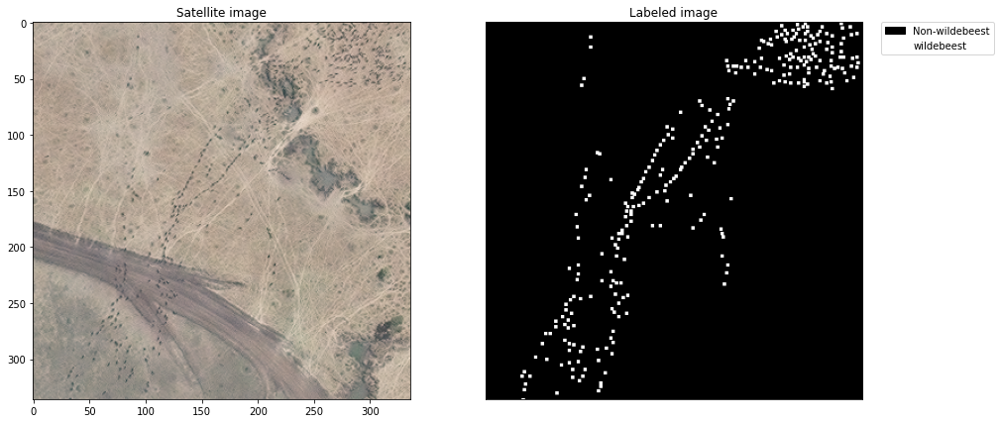

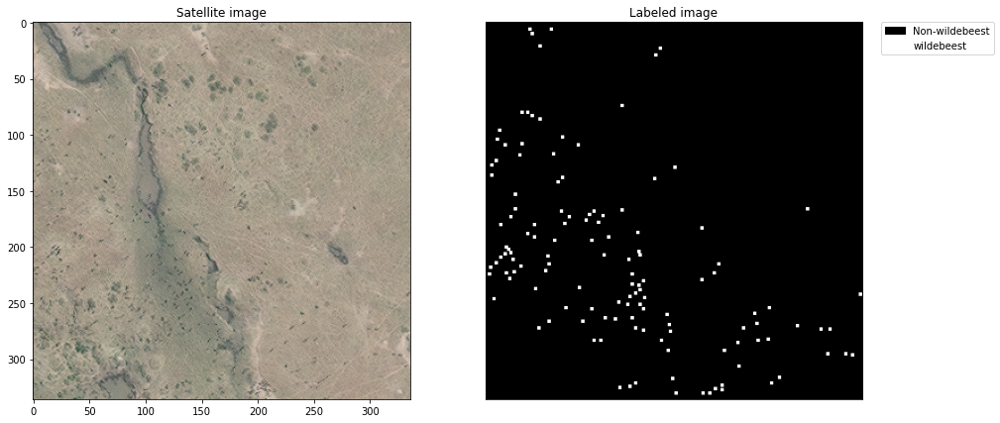

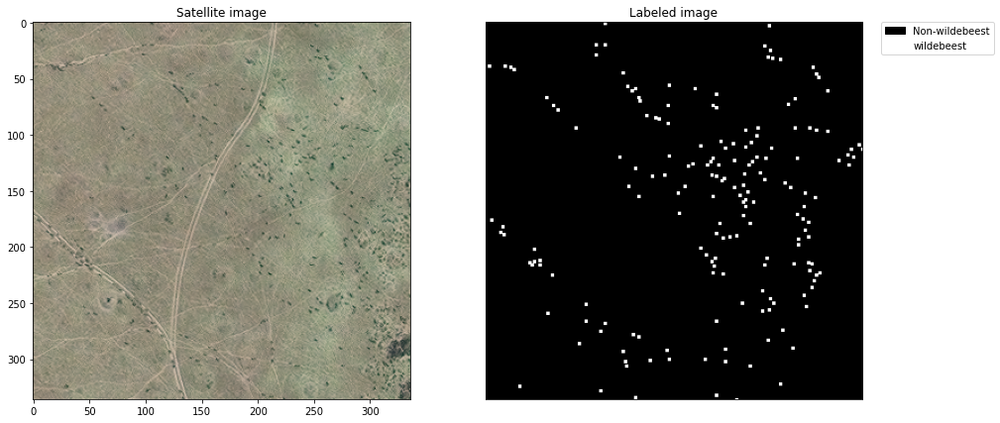

time: 1.66 s (started: 2022-07-26 03:54:41 +00:00)


In [8]:
#select a sample image, visualize the satellite image and labeled image 
Xtest_int = np.uint8(Xtest)
Ytest_int = np.uint8(Ytest)
for i in range(97, 100):
    visualize_data(Xtest_int[i], Ytest_int[i])

In [ ]:
#Check the percentage of wildebeest pixels with respect to non-wildebeest
wb_px=len(Ytrain[Ytrain==1])/(len(Ytrain[Ytrain==1])+len(Ytrain[Ytrain==0]))
nonwb_px=len(Ytrain[Ytrain==0])/(len(Ytrain[Ytrain==1])+len(Ytrain[Ytrain==0]))
print("Pixel percentage of Wildbeests = " + str(wb_px* 100)) #We can observe that the percentage of wildebeest pixels are really less (<3%)
print("Pixel percentage of non-Wildbeests = " + str(nonwb_px* 100)) 

Pixel percentage of Wildbeests = 0.7760281250371004
Pixel percentage of non-Wildbeests = 99.2239718749629
time: 179 ms (started: 2022-07-25 07:02:42 +00:00)


In [ ]:
print(np.max(Xtest))
print(np.max(Ytest))

print(np.max(Xtrain))
print(np.max(Ytrain))

255.0
1.0
255
1
time: 103 ms (started: 2022-07-25 07:02:42 +00:00)


# Model generation (U-Net) and training

## Define the model (U-Net)

In [9]:
#Tversky loss function, which assigns more weights to false positive/false negative by adjusting alpha and beta parameters
epsilon = 0.000001

weight_set = 0.9

def tversky(y_true, y_pred, alpha=1-weight_set, beta=weight_set):
    """
    Function to calculate the Tversky loss for imbalanced data
    Args:
      y_true: the segmentation ground_truth
      y_pred: prediction: the logits
      alpha: weight of false positives
      beta: weight of false positives

    Return: the loss
    """
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    # TP
    true_pos = K.sum(y_true_pos * y_pred_pos)
    # FN
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    # FP
    false_pos = K.sum((1-y_true_pos) * y_pred_pos)
    return 1 - ((true_pos + epsilon)/(true_pos + alpha * false_neg + beta * false_pos + epsilon))

def accuracy(y_true, y_pred, threshold=0.5):
    """compute accuracy"""
    y_t = y_true[...,0]
    y_t = y_t[...,np.newaxis]
    y_pred = K.round(y_pred +0.5 - threshold)
    return K.equal(K.round(y_t), K.round(y_pred))

# K.round() returns the Element-wise rounding to the closest integer
# so the threshold to determine a true positive is here!
def true_positives(y_true, y_pred, threshold=0.5):
    """compute true positive"""
    y_pred = K.round(y_pred +0.5 - threshold)
    return K.round(y_true * y_pred)

def false_positives(y_true, y_pred, threshold=0.5):
    """compute false positive"""
    y_pred = K.round(y_pred +0.5 - threshold)
    return K.round((1 - y_true) * y_pred)

def true_negatives(y_true, y_pred, threshold=0.5):
    """compute true negative"""
    y_pred = K.round(y_pred +0.5 - threshold)
    return K.round((1 - y_true) * (1 - y_pred))

def false_negatives(y_true, y_pred, threshold=0.5):
    """compute false negative"""
    y_pred = K.round(y_pred +0.5 - threshold)
    return K.round((y_true) * (1 - y_pred))

def recall_m(y_true, y_pred):
    tp = true_positives(y_true, y_pred)
    fn = false_negatives(y_true, y_pred)
    recall = K.sum(tp) / (K.sum(tp) + K.sum(fn)+ epsilon)
    return recall

def precision_m(y_true, y_pred):
    #y_t = y_true[...,0]
    #y_t = y_t[...,np.newaxis]
    tp = true_positives(y_true, y_pred)
    fp = false_positives(y_true, y_pred)
    precision = K.sum(tp) / (K.sum(tp) + K.sum(fp)+ epsilon)
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+epsilon))


def print_pixel_accuracy(predictions, Ytest):
  print("Pixel-level accuracy:")
  print("precision_m: ",K.sum(precision_m(Ytest, predictions)))
  print("recall_m: " ,K.sum(recall_m(Ytest, predictions)))
  print("f1_m: " ,K.sum(f1_m(Ytest, predictions)))

#Model builder

from tensorflow.keras.optimizers import Adam, Adadelta, Adagrad, Nadam
# Define callbacks for the early stopping of training, LearningRateScheduler and model checkpointing
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau, TensorBoard


def unet(pretrained_weights = None,input_size = (PATCHSIZE,PATCHSIZE,NUMBER_BANDS),
         learning_rate = 1.0e-04, drop_out = 0, regularizers = regularizers.l2(0.0001)):
  inputs = Input(input_size)
  conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
  conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
  norm1 = BatchNormalization()(conv1)
  pool1 = MaxPooling2D(pool_size=(2, 2))(norm1)
  conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
  conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2)
  norm2 = BatchNormalization()(conv2)
  pool2 = MaxPooling2D(pool_size=(2, 2))(norm2)
  conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
  conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3)
  norm3 = BatchNormalization()(conv3)
  pool3 = MaxPooling2D(pool_size=(2, 2))(norm3)
  conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
  conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4)
  norm4 = BatchNormalization()(conv4)
  drop4 = Dropout(drop_out)(norm4)
  pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

  conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
  conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv5)
  drop5 = Dropout(drop_out)(conv5)

  up6 = Conv2D(512, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(drop5))
  norm6 = BatchNormalization()(up6)
  merge6 = Concatenate(axis = 3)([drop4, norm6])
  conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)
  conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv6)

  up7 = Conv2D(256, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv6))
  norm7 = BatchNormalization()(up7)
  merge7 = Concatenate(axis = 3)([norm3,norm7])
  conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)
  conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv7)

  up8 = Conv2D(128, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv7))
  norm8 = BatchNormalization()(up8)
  merge8 = Concatenate(axis = 3)([norm2,norm8])
  conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)
  conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8)

  up9 = Conv2D(64, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv8))
  norm9 = BatchNormalization()(up9)
  merge9 = Concatenate(axis = 3)([norm1,norm9])
  conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)
  conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
  conv9 = Conv2D(2, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
  conv10 = Conv2D(1, 1, activation = 'sigmoid', kernel_regularizer= regularizers)(conv9)

  model = Model(inputs = inputs, outputs = conv10)
  
  OPTIMIZER = Adam(lr= learning_rate, decay= 0.0, beta_1= 0.9, beta_2= 0.999, epsilon= 1.0e-8)
  #OPTIMIZER = Adadelta(lr=1.0, rho=0.95, epsilon=None, decay=0.0)
  #OPTIMIZER = Adam(lr= 1.0e-04, decay= 0.0, beta_1= 0.9, beta_2= 0.999, epsilon= 1.0e-8)
  #OPTIMIZER = Nadam(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, schedule_decay=0.004)
  #OPTIMIZER = Adagrad(lr=0.01, epsilon=None, decay=0.0)

  LOSS = tversky

  model.compile(optimizer=OPTIMIZER, loss=LOSS, metrics=[accuracy, precision_m, recall_m, f1_m])
  #model.summary()

  if(pretrained_weights):
    model.load_weights(pretrained_weights)

  return model

time: 277 ms (started: 2022-07-26 03:54:42 +00:00)


In [ ]:
#check the GPU colab assigns to you
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)


Thu Jul 21 13:42:50 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8     8W /  70W |      3MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

##K-fold splitting ensemble
######Deep learning model has its randomness and uncertainty. To achieve a more robust and reliable model, we adopted K-fold spliting to create an ensemble model.
######We split the training dataset into k folds. We use 1 fold as the validation dataset during training, and the remaining k-1 folds as the training dataset. This way we will have k models with each model learning different variations of the dataset. 
######Then the predictions of all the k models are averaged to get the final prediction.

In [10]:
import sklearn
from sklearn.model_selection import KFold

time: 848 µs (started: 2022-07-26 03:54:43 +00:00)


In [11]:
#set the number of folds -- k
num_folds = 10
# Define per-fold score containers
fold = []
precision_per_fold = []
recall_per_fold = []
f1_per_fold = []
loss_per_fold = []
kfold = KFold(n_splits=num_folds, shuffle=True, random_state = 4)

Val_precision_per_fold = []
Val_recall_per_fold = []
Val_f1_per_fold = []

Test_precision_per_fold = []
Test_recall_per_fold = []
Test_f1_per_fold = []

time: 4.04 ms (started: 2022-07-26 03:54:43 +00:00)


In [12]:
#split the dataset into k folds, save the index of training and validation data
split = []
for train, val in kfold.split(Xtrain, Ytrain):
  com = {'train': train, 'val': val}
  split.append(com)
  print(com['train'])
  print(com['val'])

[  0   2   3   4   5   6   7   8   9  10  12  13  14  15  16  17  18  19
  20  21  22  23  24  25  26  27  28  29  30  31  32  35  36  37  38  39
  40  41  42  43  44  45  46  49  50  51  52  53  54  55  56  57  58  59
  60  62  63  64  65  66  67  68  69  70  71  72  73  74  75  77  78  79
  80  81  83  85  86  87  88  89  90  91  93  94  95  96  97  98  99 100
 101 103 104 105 106 107 109 110 111 113 114 115 116 117 118 121 122 123
 124 125 126 127 129 130 131 132 133 134 135 136 137 138 139 140 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 169 170 171 172 173 174 175 176 177 178 179 180
 181 183 184 185 186 187 188 189 190]
[  1  11  33  34  47  48  61  76  82  84  92 102 108 112 119 120 128 141
 168 182]
[  0   1   2   3   4   5   7   8   9  10  11  12  13  15  16  17  19  20
  21  22  23  24  25  27  28  29  30  31  32  33  34  35  36  37  38  39
  40  41  42  43  44  46  47  48  49  50  51  52  53  54  55  56  57  58
  5

## Train the model

In [ ]:
# Define callbacks for the early stopping of training, LearningRateScheduler and model checkpointing
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau, TensorBoard

check_path = os.path.join(Folder, 'tmp/checkpoint/weights.{epoch:02d}-{val_loss:.4f}.hdf5')
checkpoint = ModelCheckpoint(check_path, monitor='val_loss', verbose=1, 
                             save_best_only=False, mode='min', save_weights_only = True)

#reduceonplatea; It can be useful when using adam as optimizer
#Reduce learning rate when a metric has stopped improving (after some patience,reduce by a factor of 0.33, new_lr = lr * factor).
#cooldown: number of epochs to wait before resuming normal operation after lr has been reduced.
reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss', factor=0.33,
                                   patience=20, verbose=1, mode='min',
                                   min_delta=0.0001, cooldown=4, min_lr=1e-16)

#early = EarlyStopping(monitor="val_loss", mode="min", verbose=2, patience=30)

# log_dir="\\tmp\\logs\\UNet" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

#Use this directory if you are using Google Colaboratory
log_dir = os.path.join(Folder, "tmp/logs/UNet")
print(log_dir)

tensorboard = TensorBoard(log_dir=log_dir, histogram_freq=0, write_graph=True, write_grads=False, write_images=False, embeddings_freq=0, embeddings_layer_names=None, embeddings_metadata=None, embeddings_data=None, update_freq='epoch')

callbacks_list = [checkpoint, reduceLROnPlat, tensorboard] #reduceLROnPlat is not required with adaDelta

# callbacks_list = [checkpoint, reduceLROnPlat]

/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/logs/UNet
time: 13.3 ms (started: 2022-07-22 06:08:33 +00:00)


In [ ]:
#load tensorboard
%reload_ext tensorboard

# %tensorboard --logdir /tmp/logs/UNet
%tensorboard --logdir /content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/logs/UNet


Output hidden; open in https://colab.research.google.com to view.

There are 684 number of augmented training patches


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


------------------------------------------------------------------------
Training for fold 1 ...
Epoch 1/20
57/57 [==============================] - ETA: 0s - loss: 0.9870 - accuracy: 0.6342 - precision_m: 0.0247 - recall_m: 0.9689 - f1_m: 0.0477
Epoch 1: saving model to /content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/checkpoint/weights.01-0.9922.hdf5
57/57 [==============================] - 94s 2s/step - loss: 0.9870 - accuracy: 0.6342 - precision_m: 0.0247 - recall_m: 0.9689 - f1_m: 0.0477 - val_loss: 0.9922 - val_accuracy: 0.9926 - val_precision_m: 0.0988 - val_recall_m: 0.0097 - val_f1_m: 0.0167 - lr: 1.0000e-04
Epoch 2/20
57/57 [==============================] - ETA: 0s - loss: 0.9602 - accuracy: 0.9324 - precision_m: 0.1394 - recall_m: 0.9444 - f1_m: 0.2258
Epoch 2: saving model to /content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/checkpoint/weights.02-0.9291.hdf5
57/57 [==============================] - 90s 2s/s

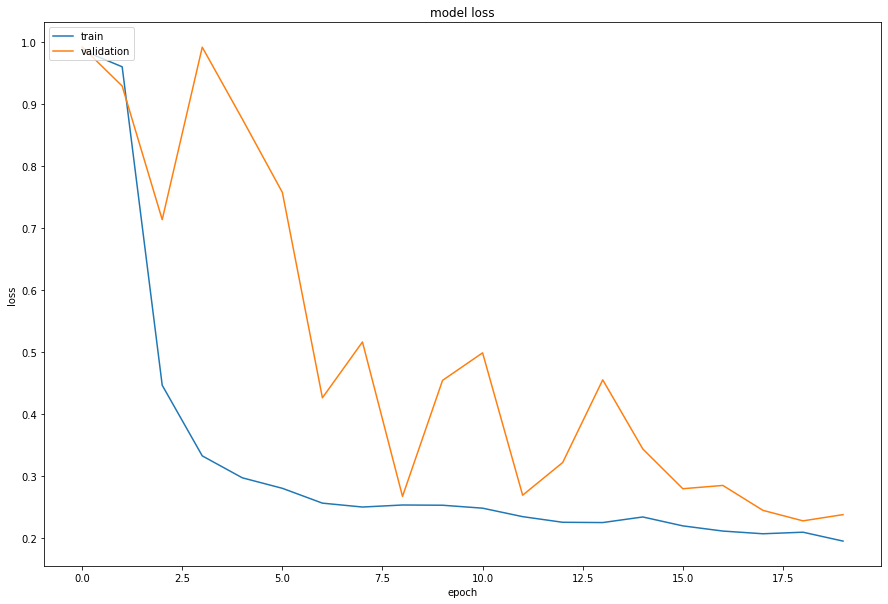

/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/checkpoint/weights.19-0.2271.hdf5
Score for fold 1: precision_m of 0.9089764356613159; recall_m of 0.3292500078678131; f1_m of 0.48340150713920593


/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/core/counting.py:94: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  distances = [point.distance(ip) for ip in interesting_points
/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/core/counting.py:96: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  closest_point = interesting_points[distances.index(min(distances))]


Wildebeest-level accuracy: on testing dataset  
Total TP:  932
Total FP:  71
Total FN:  819
Precision:  0.9292123629112662
Recall:  0.5322672758423758
F1-score:  0.6768336501300048


/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/core/counting.py:94: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  distances = [point.distance(ip) for ip in interesting_points
/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/core/counting.py:96: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  closest_point = interesting_points[distances.index(min(distances))]
/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/core/counting.py:94: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts o

Wildebeest-level accuracy: on testing dataset  
Total TP:  1820
Total FP:  371
Total FN:  429
Precision:  0.8306709265175719
Recall:  0.8092485549132948
F1-score:  0.819819769828355
There are 688 number of augmented training patches


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


------------------------------------------------------------------------
Training for fold 2 ...
Epoch 1/20
58/58 [==============================] - ETA: 0s - loss: 0.9096 - accuracy: 0.7946 - precision_m: 0.1566 - recall_m: 0.7961 - f1_m: 0.1667
Epoch 1: saving model to /content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/checkpoint/weights.01-1.0000.hdf5
58/58 [==============================] - 120s 2s/step - loss: 0.9096 - accuracy: 0.7946 - precision_m: 0.1566 - recall_m: 0.7961 - f1_m: 0.1667 - val_loss: 1.0000 - val_accuracy: 0.9930 - val_precision_m: 0.0000e+00 - val_recall_m: 0.0000e+00 - val_f1_m: 0.0000e+00 - lr: 1.0000e-04
Epoch 2/20
58/58 [==============================] - ETA: 0s - loss: 0.4328 - accuracy: 0.9933 - precision_m: 0.6797 - recall_m: 0.2820 - f1_m: 0.3833
Epoch 2: saving model to /content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/checkpoint/weights.02-0.9340.hdf5
58/58 [=============================

KeyboardInterrupt: ignored

time: 48min 57s (started: 2022-07-21 15:33:09 +00:00)


In [ ]:
#k-fold ensemble model training
fold_no = 1
i = fold_no - 1
NUMBER_EPOCHS = 20
BATCH_SIZE = 12 
weight_set = 0.9
lr_set = 1.0e-04
drop_set = 0
weight_path = os.path.join(Folder, "tmp/checkpoint")


#redefine tversky loss to adjust the weight according to your setting
def tversky(y_true, y_pred, alpha=1-weight_set, beta=weight_set):
    """
    Function to calculate the Tversky loss for imbalanced data
    Args:
      y_true: the segmentation ground_truth
      y_pred: prediction: the logits
      alpha: weight of false positives
      beta: weight of false positives

    Return: the loss
    """
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    # TP
    true_pos = K.sum(y_true_pos * y_pred_pos)
    # FN
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    # FP
    false_pos = K.sum((1-y_true_pos) * y_pred_pos)
    return 1 - (true_pos + epsilon)/(true_pos + alpha * false_neg + beta * false_pos + epsilon)

while i < num_folds:
  train = split[i]['train']
  val = split[i]['val']
  xtrain, ytrain = augment_data(Xtrain[train], Ytrain[train])
  xval = np.float32((Xtrain[val]))
  yval = np.float32(Ytrain[val])

#   pretrained_weight_path = "GeoEye_model/tmp/weights/NIR/best_weights_lr_0.0001_weight_0.9_fold_{}v2.hdf5".format(fold_no)
#   model = unet(pretrained_weights=pretrained_weight_path, input_size = (PATCHSIZE,PATCHSIZE,NUMBER_BANDS),learning_rate = lr_set, drop_out = drop_set)
  model = unet(pretrained_weights=None, input_size = (PATCHSIZE,PATCHSIZE,NUMBER_BANDS),learning_rate = lr_set, drop_out = drop_set)
  

  # Generate a print
  print('------------------------------------------------------------------------')
  print(f'Training for fold {fold_no} ...')

  hist = model.fit(x=xtrain,
                     y=ytrain,
                     epochs=NUMBER_EPOCHS,
                     batch_size = BATCH_SIZE,
                     validation_data=(xval,yval),
                     callbacks=callbacks_list,
                     verbose=1
                    )
      # summarize history for loss
  plt.plot(hist.history['loss'])
  plt.plot(hist.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'validation'], loc='upper left')
  plt.show()
    
  # find the best weights with lowest validation loss
  best_loss = np.min(hist.history['val_loss'])
  best_epoch = hist.history['val_loss'].index(best_loss)+1
  
  #add criteria of lowest_loss to determine if it is needed to retrain the model
  #because sometimes the loss does not decrease at all, and it need to be retrained

  if best_loss < 0.4:
    #save the training history
    history = pd.DataFrame(hist.history)
    history.to_csv(os.path.join(Folder, 'tmp/checkpoint/hist_fold{}.csv'.format(fold_no)))
    best_path = os.path.join(weight_path, 'weights.{:02d}-{:.4f}.hdf5'.format(best_epoch,best_loss))
    print(best_path)

    model.load_weights(best_path)
    
    #rename the best weights
    os.rename(best_path,os.path.join(weight_path, 'best_weights_fold_{}.hdf5'.format(fold_no)))

    # Evaluate on validation dataset
    scores = model.evaluate(xval, yval, verbose=0)
    print(f'Score for fold {fold_no}: {model.metrics_names[2]} of {scores[2]}; {model.metrics_names[3]} of {scores[3]}; {model.metrics_names[4]} of {scores[4]}')
    fold.append(fold_no)
    precision_per_fold.append(scores[2] * 100)
    recall_per_fold.append(scores[3] * 100)
    f1_per_fold.append(scores[4] * 100)
    loss_per_fold.append(scores[0])

    
    # Generate generalization metrics on validation dataset
    predict = model.predict(xval)
    Ypredict = (predict-np.min(predict))/(np.max(predict)-np.min(predict))

    Ypredict[Ypredict>0.5]=1.0
    Ypredict[Ypredict<=0.5]=0.0
    #print_pixel_accuracy(Ypredict, Ytest)

    dic_val= dataset_evaluation(Ypredict, yval, Ytrain_meta[val])
    #save the accuracy
    Val_precision_per_fold.append(dic_val['Precision'])
    Val_recall_per_fold.append(dic_val['Recall'])
    Val_f1_per_fold.append(dic_val['F1'])   
    
    
    # Generate generalization metrics on Testing dataset
    predict = model.predict(Xtest)
    Ypredict = (predict-np.min(predict))/(np.max(predict)-np.min(predict))

    Ypredict[Ypredict>0.5]=1.0
    Ypredict[Ypredict<=0.5]=0.0
    #print_pixel_accuracy(Ypredict, Ytest)

    dic_test= dataset_evaluation(Ypredict, Ytest, Ytest_meta)
    #save the accuracy
    Test_precision_per_fold.append(dic_test['Precision'])
    Test_recall_per_fold.append(dic_test['Recall'])
    Test_f1_per_fold.append(dic_test['F1'])

    del model
    del hist
    gc.collect()
    K.clear_session()

    # Increase fold number
    fold_no = fold_no + 1
    i = i + 1    

  else:
    print("The loss did not decrease significantly. Retrain this model...")
    del model
    del hist
    gc.collect()
    K.clear_session()


# # == Provide average scores ==
# print('------------------------------------------------------------------------')
# print('Score per fold')
# for i in range(0, len(loss_per_fold)):
#   print('------------------------------------------------------------------------')
#   print(f'> Fold {i+1} - Loss: {loss_per_fold[i]} - Precision: {precision_per_fold[i]}% - Recall: {recall_per_fold[i]}% - F1: {f1_per_fold[i]}%')
#   print('On validation dataset------------------------------------------------------')
#   print(f'> Fold {i+1} - Total Precision: {Val_precision_per_fold[i]}% - Total Recall: {Val_recall_per_fold[i]}% - Total F1: {i]}%')
#   print('On testing dataset------------------------------------------------------')
#   print(f'> Fold {i+1} - Total Precision: {Test_precision_per_fold[i]}% - Total Recall: {Test_recall_per_fold[i]}% - Total F1: {Test_f1_per_fold[i]}%')
# print('------------------------------------------------------------------------')
# print('Average validation scores for all folds:')
# print(f'> Precision: {np.mean(precision_per_fold)} (+- {np.std(precision_per_fold)})%')
# print(f'> Recall: {np.mean(recall_per_fold)} (+- {np.std(recall_per_fold)})%')
# print(f'> F1-score: {np.mean(f1_per_fold)} (+- {np.std(f1_per_fold)})%')
# print(f'> Loss: {np.mean(loss_per_fold)} (+- {np.std(loss_per_fold)})')
# print('------------------------------------------------------------------------')
# print('------------------------------------------------------------------------')
# print('Average validation accuracy for all folds:')
# print(f'> Precision: {np.mean(Val_precision_per_fold)} (+- {np.std(Val_precision_per_fold)})%')
# print(f'> Recall: {np.mean(Val_recall_per_fold)} (+- {np.std(Val_recall_per_fold)})%')
# print(f'> F1-score: {np.mean(Val_f1_per_fold)} (+- {np.std(Val_f1_per_fold)})%')
# print('------------------------------------------------------------------------')
# print('Average accuracy on testing dataset for all folds------------------------------------------------------')
# print(f'> Precision: {np.mean(Test_precision_per_fold)} (+- {np.std(Test_precision_per_fold)})%')
# print(f'> Recall: {np.mean(Test_recall_per_fold)} (+- {np.std(Test_recall_per_fold)})%')
# print(f'> F1-score: {np.mean(Test_f1_per_fold)} (+- {np.std(Test_f1_per_fold)})%')
# print('------------------------------------------------------------------------')

# Save the results
dic = {}
dic['fold'] = fold
dic['precision'] = precision_per_fold
dic['recall'] = recall_per_fold
dic['f1'] = f1_per_fold
dic['val_loss'] = loss_per_fold
dic['Val_precision'] = Val_precision_per_fold
dic['Val_recall'] = Val_recall_per_fold
dic['Val_f1'] = Val_f1_per_fold
dic['Test_precision'] = Test_precision_per_fold
dic['Test_recall'] = Test_recall_per_fold
dic['Test_f1'] = Test_f1_per_fold
results = pd.DataFrame(dic) 
results.to_csv(os.path.join(weight_path, 'kfold_result.csv'), index = False)

##Parameter tuning
######The parameters that influence the model performance are mainly: 
1. weight of false positives in Tversky loss function
2. initial learning rate.

There are 684 number of augmented training patches
weight of FP: 0.9


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


------------------------------------------------------------------------
Training for fold 1 ...
Epoch 1/5
57/57 [==============================] - ETA: 0s - loss: 0.9851 - accuracy: 0.8207 - precision_m: 0.0593 - recall_m: 0.9605 - f1_m: 0.1092
Epoch 1: val_loss improved from inf to 0.99257, saving model to /content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/parameter_tuning/weights_lr_0.0001_weight_0.9_fold_1.hdf5
57/57 [==============================] - 153s 2s/step - loss: 0.9851 - accuracy: 0.8207 - precision_m: 0.0593 - recall_m: 0.9605 - f1_m: 0.1092 - val_loss: 0.9926 - val_accuracy: 0.9926 - val_precision_m: 0.1425 - val_recall_m: 0.0169 - val_f1_m: 0.0289 - lr: 1.0000e-04
Epoch 2/5
57/57 [==============================] - ETA: 0s - loss: 0.9840 - accuracy: 0.9360 - precision_m: 0.1105 - recall_m: 0.9814 - f1_m: 0.1957
Epoch 2: val_loss improved from 0.99257 to 0.98698, saving model to /content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitor

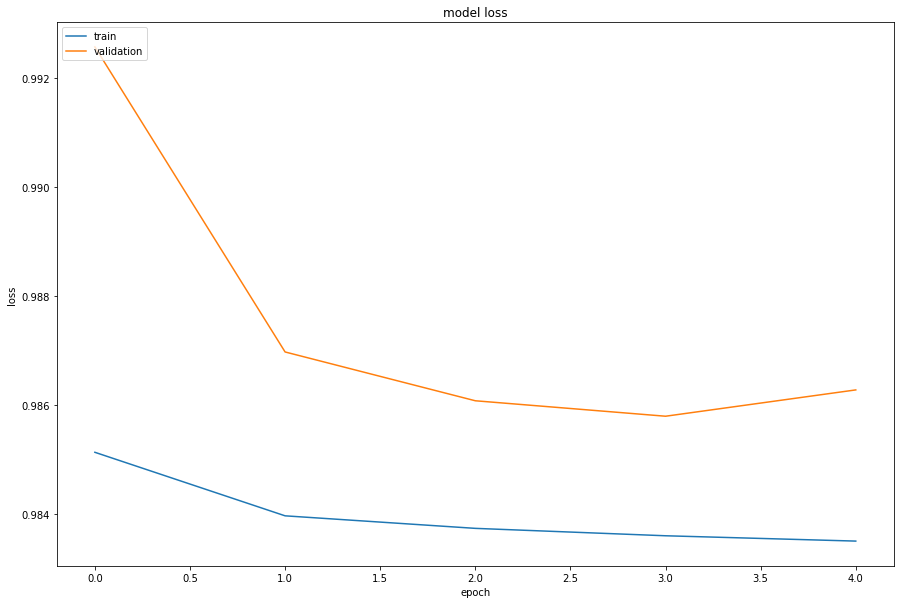

best loss:  0.9857986569404602
best epoch:  4
The loss did not decrease significantly. Retrain this model...
There are 684 number of augmented training patches
weight of FP: 0.9
------------------------------------------------------------------------
Training for fold 1 ...
Epoch 1/5
57/57 [==============================] - ETA: 0s - loss: 0.6932 - accuracy: 0.9150 - precision_m: 0.3985 - recall_m: 0.4239 - f1_m: 0.2636
Epoch 1: val_loss improved from inf to 1.00026, saving model to /content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/parameter_tuning/weights_lr_0.0001_weight_0.9_fold_1.hdf5
57/57 [==============================] - 101s 2s/step - loss: 0.6932 - accuracy: 0.9150 - precision_m: 0.3985 - recall_m: 0.4239 - f1_m: 0.2636 - val_loss: 1.0003 - val_accuracy: 0.9932 - val_precision_m: 0.0000e+00 - val_recall_m: 0.0000e+00 - val_f1_m: 0.0000e+00 - lr: 1.0000e-04
Epoch 2/5
57/57 [==============================] - ETA: 0s - loss: 0.3977 - accuracy: 0.

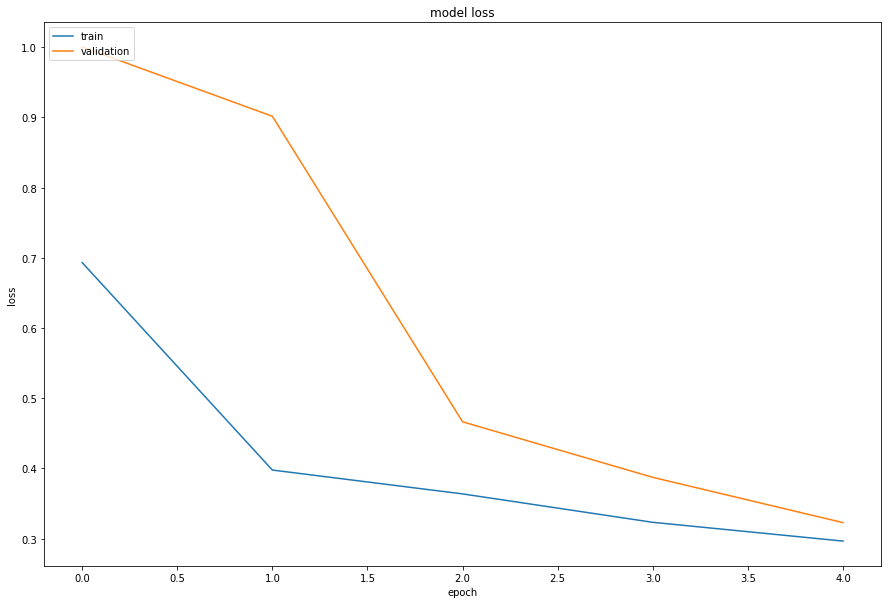

best loss:  0.3227837085723877
best epoch:  5
/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/parameter_tuning/weights_lr_0.0001_weight_0.9_fold_1.hdf5
There are 688 number of augmented training patches
weight of FP: 0.9
------------------------------------------------------------------------
Training for fold 2 ...
Epoch 1/5
58/58 [==============================] - ETA: 0s - loss: 0.6745 - accuracy: 0.9719 - precision_m: 0.4650 - recall_m: 0.2423 - f1_m: 0.2494
Epoch 1: val_loss improved from inf to 1.00012, saving model to /content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/parameter_tuning/weights_lr_0.0001_weight_0.9_fold_2.hdf5
58/58 [==============================] - 121s 2s/step - loss: 0.6745 - accuracy: 0.9719 - precision_m: 0.4650 - recall_m: 0.2423 - f1_m: 0.2494 - val_loss: 1.0001 - val_accuracy: 0.9930 - val_precision_m: 0.0000e+00 - val_recall_m: 0.0000e+00 - val_f1_m: 0.0000e+00 - lr: 1.0000e-04
Epoch 2/5


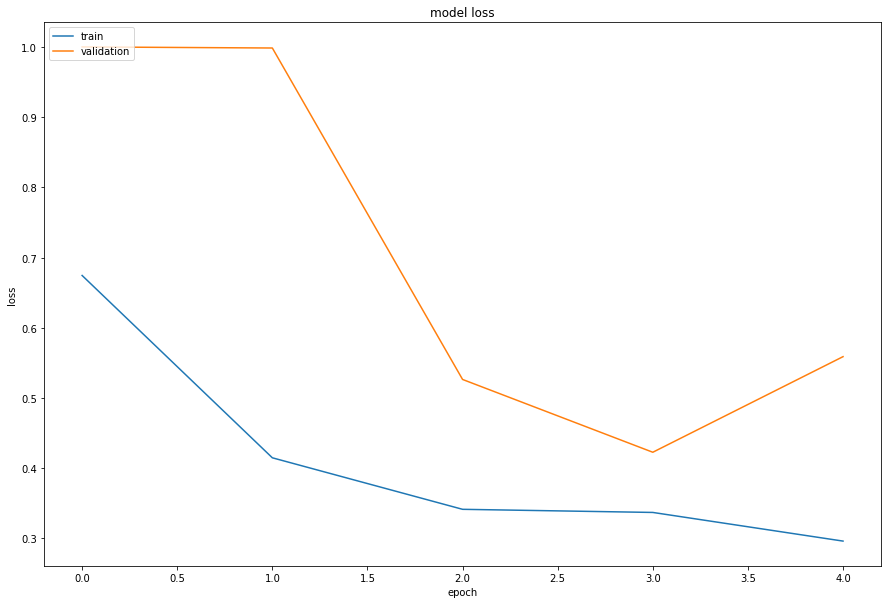

best loss:  0.42265158891677856
best epoch:  4
/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/parameter_tuning/weights_lr_0.0001_weight_0.9_fold_2.hdf5
There are 688 number of augmented training patches
weight of FP: 0.9
------------------------------------------------------------------------
Training for fold 3 ...
Epoch 1/5
58/58 [==============================] - ETA: 0s - loss: 0.7649 - accuracy: 0.9892 - precision_m: 0.0207 - recall_m: 0.0139 - f1_m: 0.0090
Epoch 1: val_loss improved from inf to 0.99921, saving model to /content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/parameter_tuning/weights_lr_0.0001_weight_0.9_fold_3.hdf5
58/58 [==============================] - 101s 2s/step - loss: 0.7649 - accuracy: 0.9892 - precision_m: 0.0207 - recall_m: 0.0139 - f1_m: 0.0090 - val_loss: 0.9992 - val_accuracy: 0.9917 - val_precision_m: 0.5000 - val_recall_m: 3.5628e-05 - val_f1_m: 7.1250e-05 - lr: 1.0000e-04
Epoch 2/5
58/

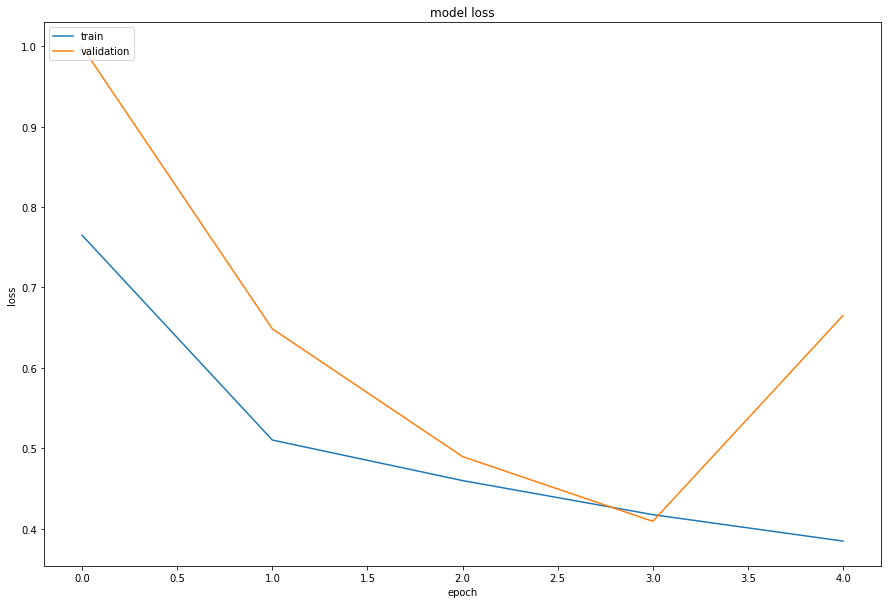

best loss:  0.4090069830417633
best epoch:  4
/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/parameter_tuning/weights_lr_0.0001_weight_0.9_fold_3.hdf5
There are 688 number of augmented training patches
weight of FP: 0.9
------------------------------------------------------------------------
Training for fold 4 ...
Epoch 1/5
58/58 [==============================] - ETA: 0s - loss: 0.6815 - accuracy: 0.9280 - precision_m: 0.4139 - recall_m: 0.4266 - f1_m: 0.2580
Epoch 1: val_loss improved from inf to 0.99884, saving model to /content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/parameter_tuning/weights_lr_0.0001_weight_0.9_fold_4.hdf5
58/58 [==============================] - 102s 2s/step - loss: 0.6815 - accuracy: 0.9280 - precision_m: 0.4139 - recall_m: 0.4266 - f1_m: 0.2580 - val_loss: 0.9988 - val_accuracy: 0.9947 - val_precision_m: 0.5000 - val_recall_m: 2.4307e-04 - val_f1_m: 4.8591e-04 - lr: 1.0000e-04
Epoch 2/5
58/5

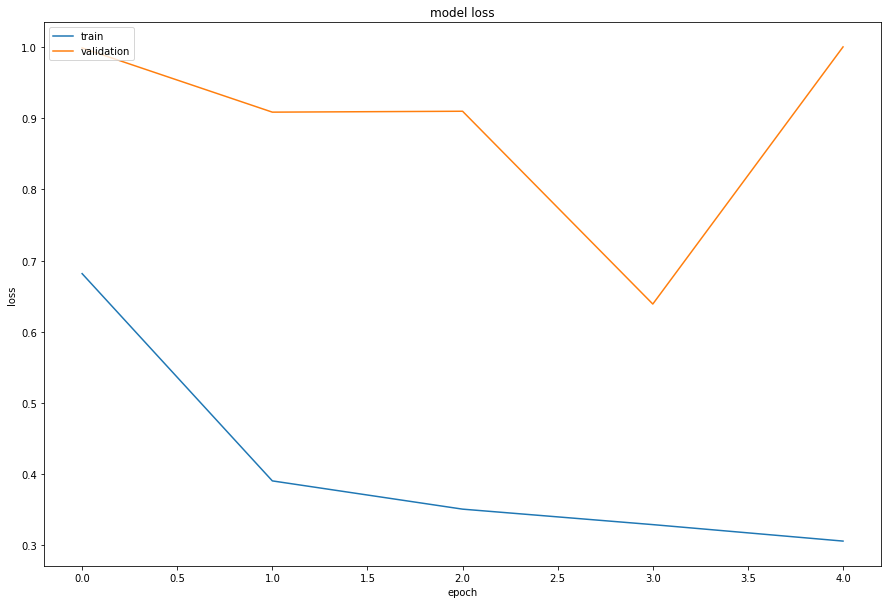

best loss:  0.6387995481491089
best epoch:  4
/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/parameter_tuning/weights_lr_0.0001_weight_0.9_fold_4.hdf5
There are 688 number of augmented training patches
weight of FP: 0.9
------------------------------------------------------------------------
Training for fold 5 ...
Epoch 1/5
58/58 [==============================] - ETA: 0s - loss: 0.7354 - accuracy: 0.8611 - precision_m: 0.3541 - recall_m: 0.6040 - f1_m: 0.2605
Epoch 1: val_loss improved from inf to 1.00019, saving model to /content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/parameter_tuning/weights_lr_0.0001_weight_0.9_fold_5.hdf5
58/58 [==============================] - 101s 2s/step - loss: 0.7354 - accuracy: 0.8611 - precision_m: 0.3541 - recall_m: 0.6040 - f1_m: 0.2605 - val_loss: 1.0002 - val_accuracy: 0.9937 - val_precision_m: 0.0000e+00 - val_recall_m: 0.0000e+00 - val_f1_m: 0.0000e+00 - lr: 1.0000e-04
Epoch 2/5


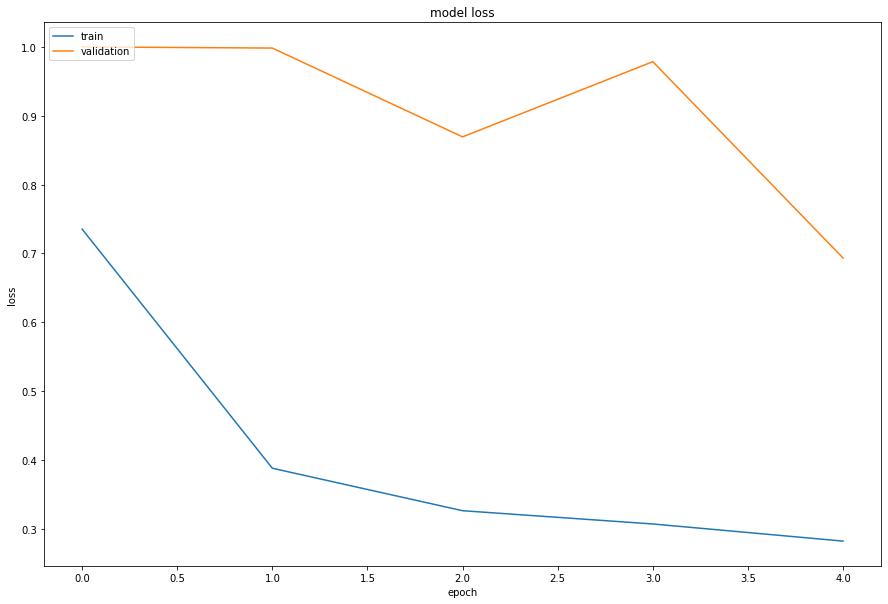

best loss:  0.6933872103691101
best epoch:  5
/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/parameter_tuning/weights_lr_0.0001_weight_0.9_fold_5.hdf5
There are 688 number of augmented training patches
weight of FP: 0.9
------------------------------------------------------------------------
Training for fold 6 ...
Epoch 1/5
58/58 [==============================] - ETA: 0s - loss: 0.8512 - accuracy: 0.9707 - precision_m: 4.2093e-04 - recall_m: 0.0389 - f1_m: 8.3150e-04
Epoch 1: val_loss improved from inf to 0.99327, saving model to /content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/parameter_tuning/weights_lr_0.0001_weight_0.9_fold_6.hdf5
58/58 [==============================] - 100s 2s/step - loss: 0.8512 - accuracy: 0.9707 - precision_m: 4.2093e-04 - recall_m: 0.0389 - f1_m: 8.3150e-04 - val_loss: 0.9933 - val_accuracy: 0.9880 - val_precision_m: 0.0000e+00 - val_recall_m: 0.0000e+00 - val_f1_m: 0.0000e+00 - lr: 1.000

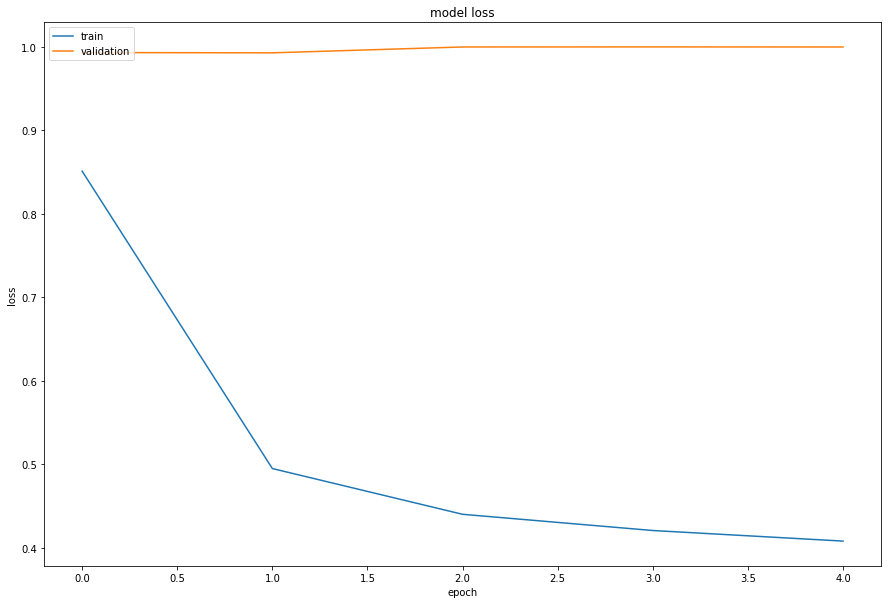

best loss:  0.9929434061050415
best epoch:  2
The loss did not decrease significantly. Retrain this model...
There are 688 number of augmented training patches
weight of FP: 0.9
------------------------------------------------------------------------
Training for fold 6 ...
Epoch 1/5
58/58 [==============================] - ETA: 0s - loss: 0.6669 - accuracy: 0.9200 - precision_m: 0.4195 - recall_m: 0.4453 - f1_m: 0.2590
Epoch 1: val_loss improved from inf to 1.00027, saving model to /content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/parameter_tuning/weights_lr_0.0001_weight_0.9_fold_6.hdf5
58/58 [==============================] - 101s 2s/step - loss: 0.6669 - accuracy: 0.9200 - precision_m: 0.4195 - recall_m: 0.4453 - f1_m: 0.2590 - val_loss: 1.0003 - val_accuracy: 0.9880 - val_precision_m: 0.0000e+00 - val_recall_m: 0.0000e+00 - val_f1_m: 0.0000e+00 - lr: 1.0000e-04
Epoch 2/5
58/58 [==============================] - ETA: 0s - loss: 0.3770 - accuracy: 0.

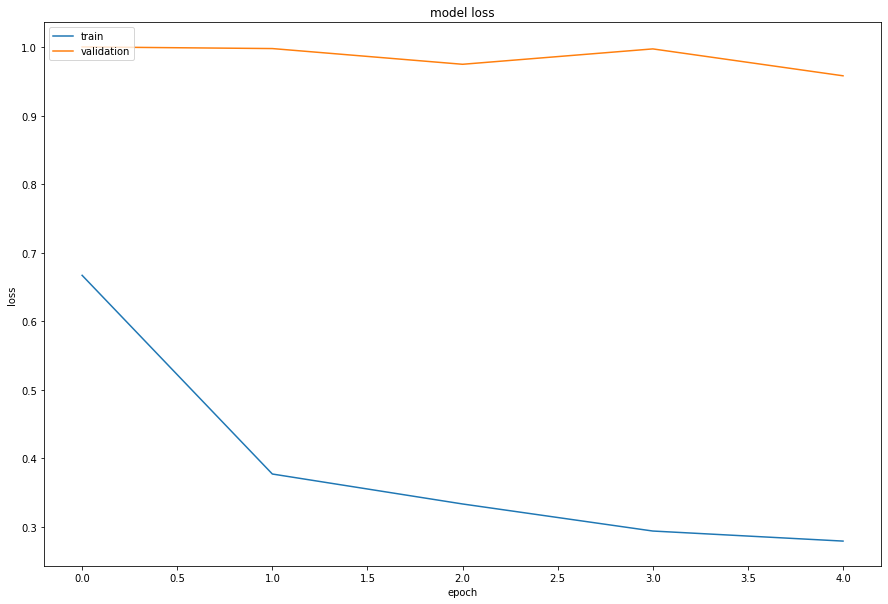

best loss:  0.9581109881401062
best epoch:  5
The loss did not decrease significantly. Retrain this model...
There are 688 number of augmented training patches
weight of FP: 0.9
------------------------------------------------------------------------
Training for fold 6 ...
Epoch 1/5
58/58 [==============================] - ETA: 0s - loss: 0.9859 - accuracy: 0.8249 - precision_m: 0.0499 - recall_m: 0.8989 - f1_m: 0.0918
Epoch 1: val_loss improved from inf to 0.98801, saving model to /content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/tmp/parameter_tuning/weights_lr_0.0001_weight_0.9_fold_6.hdf5
58/58 [==============================] - 101s 2s/step - loss: 0.9859 - accuracy: 0.8249 - precision_m: 0.0499 - recall_m: 0.8989 - f1_m: 0.0918 - val_loss: 0.9880 - val_accuracy: 0.9870 - val_precision_m: 0.0669 - val_recall_m: 0.0063 - val_f1_m: 0.0110 - lr: 1.0000e-04
Epoch 2/5
58/58 [==============================] - ETA: 0s - loss: 0.7238 - accuracy: 0.9830 - preci

In [ ]:
#######Hyperparamenters to evaluate the network#############

# weight of FP in Tversky loss function
#weight_FP = [0.01, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.99]
weight_FP = [0.9]

# Learning rate
#lr = [1e-3, 5e-4, 1e-4, 5e-5, 1e-5]
lr_set = 1e-4
drop_set = 0

num_folds = 10

dic = {}
dic["weight"] = []
dic["learning_rate"] = []

dic["precision"] = []
dic["recall"] = []
dic["f1_score"] = []

for weight_i in weight_FP:
  
  def tversky(y_true, y_pred, alpha=1-weight_i, beta=weight_i):
    """
    Function to calculate the Tversky loss for imbalanced data
    Args:
      y_true: the segmentation ground_truth
      y_pred: prediction: the logits
      alpha: weight of false positives
      beta: weight of false positives

    Return: the loss
    """
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    # TP
    true_pos = K.sum(y_true_pos * y_pred_pos)
    # FN
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    # FP
    false_pos = K.sum((1-y_true_pos) * y_pred_pos)
    return 1 - (true_pos + epsilon)/(true_pos + alpha * false_neg + beta * false_pos + epsilon)


  fold_no = 1
  i = fold_no - 1
  NUMBER_EPOCHS = 5
  BATCH_SIZE = 12 

  while i < num_folds:
    train = split[i]['train']
    val = split[i]['val']
    xtrain, ytrain = augment_data(Xtrain[train], Ytrain[train])
    xval = np.float32((Xtrain[val]))
    yval = np.float32(Ytrain[val])


    check_path = os.path.join(Folder, 'tmp/parameter_tuning/weights_lr_{}_weight_{}_fold_{}.hdf5'.format(lr_set, weight_i,fold_no))
    checkpoint = ModelCheckpoint(check_path, monitor='val_loss', verbose=1, 
                              save_best_only=True, mode='min', save_weights_only = True)
    print(f'weight of FP: {weight_i}')
    reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss', factor=0.33,
                                    patience=20, verbose=1, mode='min',
                                    min_delta=0.0001, cooldown=4, min_lr=1e-16)
    callbacks_list = [checkpoint, reduceLROnPlat]

    model = unet(pretrained_weights=None, input_size = (PATCHSIZE,PATCHSIZE,NUMBER_BANDS),learning_rate = lr_set, drop_out = drop_set)
  
    # Generate a print
    print('------------------------------------------------------------------------')
    print(f'Training for fold {fold_no} ...')

    hist = model.fit(x=xtrain,
                      y=ytrain,
                      epochs=NUMBER_EPOCHS,
                      batch_size = BATCH_SIZE,
                      validation_data=(xval,yval),
                      callbacks=callbacks_list,
                      verbose=1
                      )
    # summarize history for loss
    plt.plot(hist.history['loss'])
    plt.plot(hist.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()

    best_loss = np.min(hist.history['val_loss'])
    best_epoch = hist.history['val_loss'].index(best_loss)+1
    print('best loss: ', best_loss)
    print('best epoch: ', best_epoch)
    if best_loss < 0.9:

      best_path = os.path.join(Folder, 'tmp/parameter_tuning/weights_lr_{}_weight_{}_fold_{}.hdf5'.format(lr_set, weight_i,fold_no))
      print(best_path)

      os.rename(best_path,os.path.join(Folder, 'tmp/parameter_tuning/best_weights_lr_{}_weight_{}_fold_{}.hdf5'.format(lr_set, weight_i,fold_no)))

      history = pd.DataFrame(hist.history)
      history.to_csv(os.path.join(Folder, 'tmp/parameter_tuning/PT_hist_weight{}_learning_rate_{}_fold{}.csv'.format(weight_i,lr_set,fold_no)), index = True)

      del model
      del hist

      gc.collect()
      K.clear_session()

      # Increase fold number
      fold_no = fold_no + 1
      i = i + 1

    else:
      print("The loss did not decrease significantly. Retrain this model...")
      del model
      del hist
      gc.collect()
      K.clear_session()

  #summarize the predictions of all these k models to get the averaged results
  Ypredict = [0]
  for j in range(num_folds):
    model = unet(pretrained_weights=None, input_size = (PATCHSIZE,PATCHSIZE,NUMBER_BANDS),learning_rate = lr_set, drop_out = drop_set)
    best_path = os.path.join(Folder, 'tmp/parameter_tuning/best_weights_lr_{}_weight_{}_fold_{}.hdf5'.format(lr_set, weight_i,j+1))
    model.load_weights(best_path)
    predict = model.predict(Xtest)
    predict = (predict-np.min(predict))/(np.max(predict)-np.min(predict))
    Ypredict = Ypredict + predict/num_folds

  Ypredict[Ypredict>0.5]=1.0
  Ypredict[Ypredict<=0.5]=0.0

  del model
  gc.collect()

  dic= dataset_evaluation(Ypredict, Ytest, Data.meta_list)
  dic["weight"] = weight_i
  dic["learning_rate"] = lr_set
  # dic["weight"].append(weight_set)
  # dic["learning_rate"].append(lr_set)

  # Convert results to a dataframe
  results = pd.DataFrame(dic, index=[0])
  # Export as csv
  results.to_csv(os.path.join(Folder, 'tmp/parameter_tuning/PT_result_weight{}_learning_rate_{}.csv'.format(weight_i,lr_set)), index = False)




In [ ]:
print(dic)

{'Total_TP': 1909, 'Total_FP': 253, 'Total_FN': 340, 'Precision': 0.8829787234042553, 'Recall': 0.8488216985326812, 'F1': 0.865563314335935, 'weight': 0.8, 'learning_rate': 0.0001}
time: 1.53 ms (started: 2021-04-27 21:23:08 +00:00)


#Model testing

##Test the ensemble model on testing dataset

In [ ]:
#Test all the models of each fold and get the average prediction
# Calculate the wildebeest-level accuracy
epsilon = 1e-07

weight_path = os.path.join(Folder, 'tmp/pretrained_weights')
point_path = os.path.join(Data_folder, "data_2009Aug/3_Train_test/test/predicted_points/")
# point_path = None

cluster_size = 9

# Xtest = Xtest_2009Aug
# Ytest = Ytest_2009Aug
# Ytest_meta = Ytest_meta_2009Aug

# Xtest = Xtest_2010Sep
# Ytest = Ytest_2010Sep
# Ytest_meta = Ytest_meta_2010Sep

# Xtest = Xtest_2013Aug
# Ytest = Ytest_2013Aug
# Ytest_meta = Ytest_meta_2013Aug

# Xtest = Xtest_2015May
# Ytest = Ytest_2015May
# Ytest_meta = Ytest_meta_2015May

# Xtest = Xtest_2018Aug
# Ytest = Ytest_2018Aug
# Ytest_meta = Ytest_meta_2018Aug

# Xtest = Xtest_2020Oct
# Ytest = Ytest_2020Oct
# Ytest_meta = Ytest_meta_2020Oct

# Xtest = Xtrain_2020Oct
# Ytest = Ytrain_2020Oct
# Ytest_meta = Ytrain_meta_2020Oct

Ypredict = [0]
predict_float = [0]
num_folds = 10
weight_set = 0.9
lr_set = 1e-4

for i in range(num_folds):
  fold_no = i+1
  model = unet(pretrained_weights=None, input_size = (PATCHSIZE,PATCHSIZE,NUMBER_BANDS),
               learning_rate = lr_set)
#   best_path = os.path.join(Data_folder, 'model_2009Aug/tmp/NIR/best_weights_lr_0.0001_weight_0.9_fold_{}v2.hdf5'.format(fold_no))
#   best_path = os.path.join(Data_folder, 'model_2020Oct/tmp/scan_1103/best_weights_fold_{}.hdf5'.format(fold_no))
#   best_path = os.path.join(Data_folder, 'model_2010Sep/tmp/kfold_1203_No/best_weights_fold_{}.hdf5'.format(fold_no))
  best_path = os.path.join(weight_path, 'best_weights_fold_{}.hdf5'.format(fold_no))
  model.load_weights(best_path)
  predict = model.predict(Xtest)
  predict = (predict-np.min(predict))/(np.max(predict)-np.min(predict))
  Ypredict = Ypredict + predict/num_folds
  predict_float = predict_float + predict/num_folds
    
del model

Ypredict[Ypredict>0.5]=1.0
Ypredict[Ypredict<=0.5]=0.0

#print_pixel_accuracy(Ypredict, Ytest)

Total_TP = 0
Total_FP = 0
Total_FN = 0
TPTS = []
PPTS = []
for i in range(len(Ytest)):
#     print('Test image: ', i)
#   visualize_data(Xtest_int[i], Ytest[i])
#   visualize_data(Xtest_int[i], Ypredict[i])
    true_pts = ImageToPoints(Ytest[i],Ytest_meta[i])
  #TPTS.append(true_pts)
    predict_pts = ImageToPoints(Ypredict[i],Ytest_meta[i], cluster_size)
  #PPTS.append(true_pts)
  #accuracy = evaluation(true_pts, predict_pts, threshold=0.7, index=str(i+1), ShapefilePath = os.path.join(Data_folder, "data/test/image/predicted_points/"), meta = Data.meta_list[i].meta)
#   accuracy = evaluation(true_pts, predict_pts, threshold=0.72, index=str(i+1), ShapefilePath = os.path.join(Data_folder, "data_2020Oct/3_Train_test/test/predict"), meta =Ytest_meta[i].meta)
    accuracy = evaluation(true_pts, predict_pts, threshold=0.72, index=str(i+1), ShapefilePath = point_path, meta =Ytest_meta[i].meta)
#   print(accuracy)
    Total_TP += accuracy['TP']
    Total_FP += accuracy['FP']
    Total_FN += accuracy['FN']
#     print(Total_TP)
#     print(Total_FP)
#     print(Total_FN)
Total_precision = Total_TP/(Total_TP+Total_FP)
Total_recall = Total_TP/(Total_TP+Total_FN)
Total_f1 = 2*(Total_precision*Total_recall)/(Total_precision+Total_recall+epsilon)
print("Precision: ", Total_precision)
print("Recall: ", Total_recall)
print("F1-score: ", Total_f1)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)
/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/core/counting.py:94: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  distances = [point.distance(ip) for ip in interesting_points
/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/core/counting.py:96: ShapelyDeprecationWarning: __getitem__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  closest_point = interesting_points[distances.index(min(distances))]
/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/co

Precision:  0.8860175357637287
Recall:  0.8537127612272121
F1-score:  0.8695651674085473
time: 1min 33s (started: 2022-07-25 09:09:33 +00:00)


In [ ]:
print("Total TP: ",Total_TP)
print("Total FP: ", Total_FP)
print("Total FN: ", Total_FN)

Total TP:  1920
Total FP:  247
Total FN:  329
time: 2.08 ms (started: 2022-07-25 07:05:00 +00:00)


/content/drive/MyDrive/Colab/zijingwu-Satellite-based-monitoring-of-wildebeest/core/visualization.py:96: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  patches = [mpatches.Patch(color=colors[i], label=j, edgecolor='black') for i, j in zip(range(len(values)), data3)]


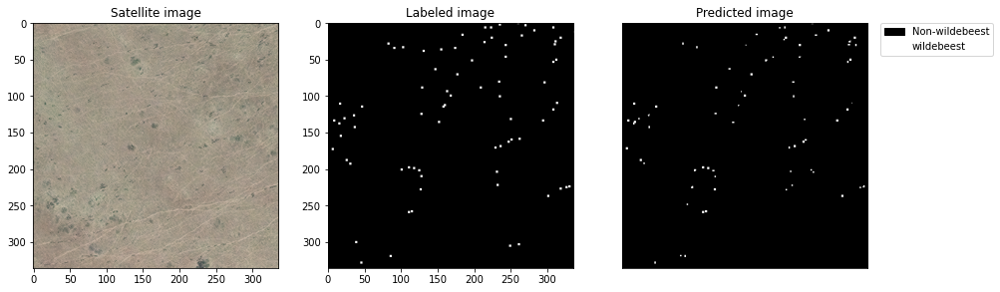

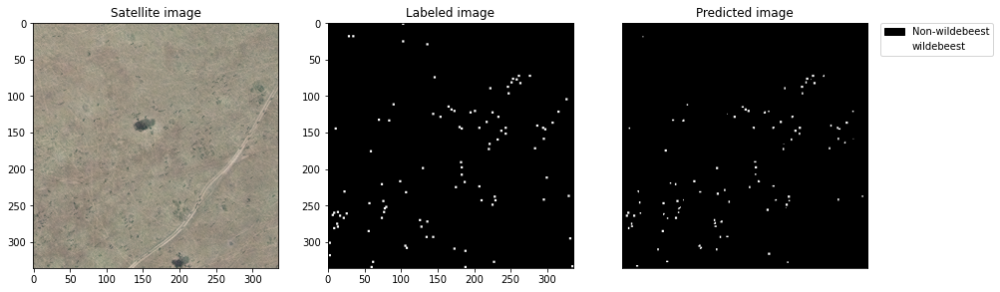

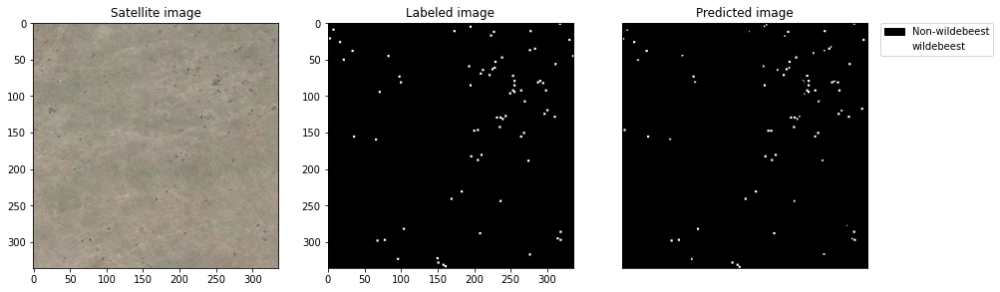

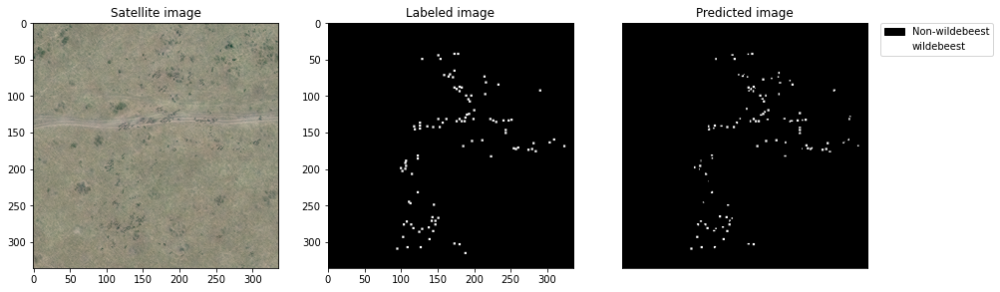

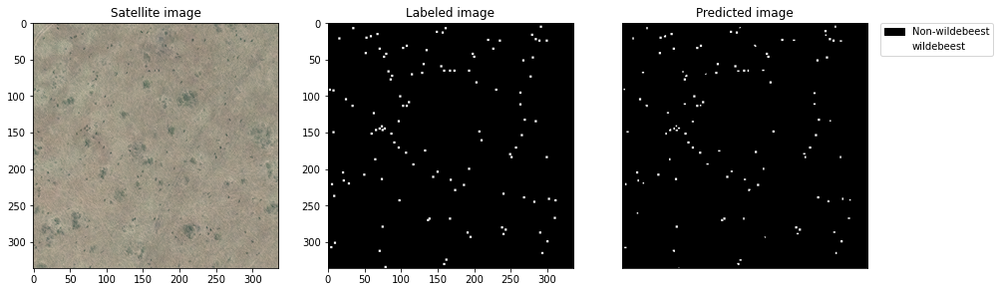

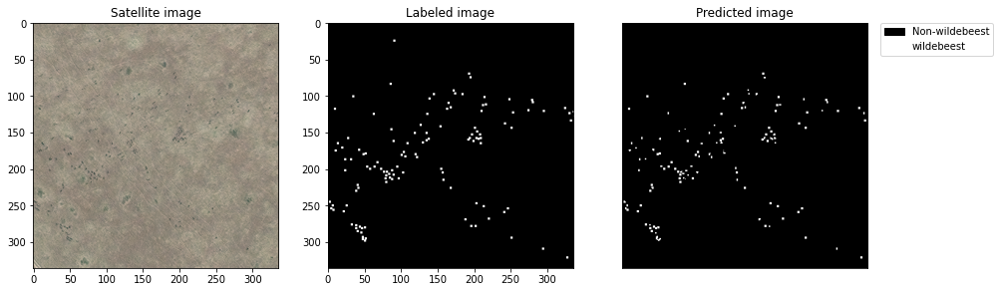

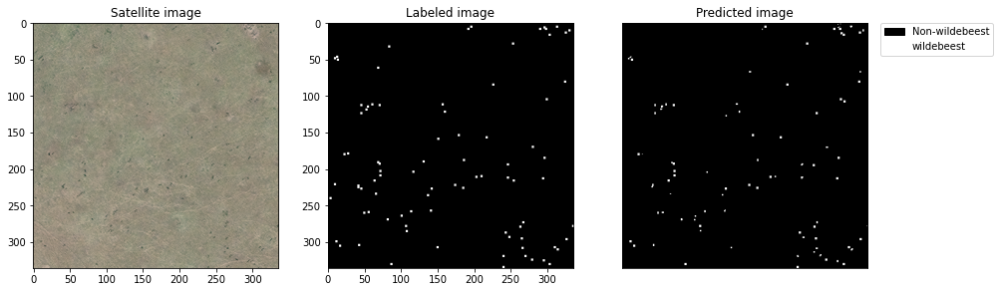

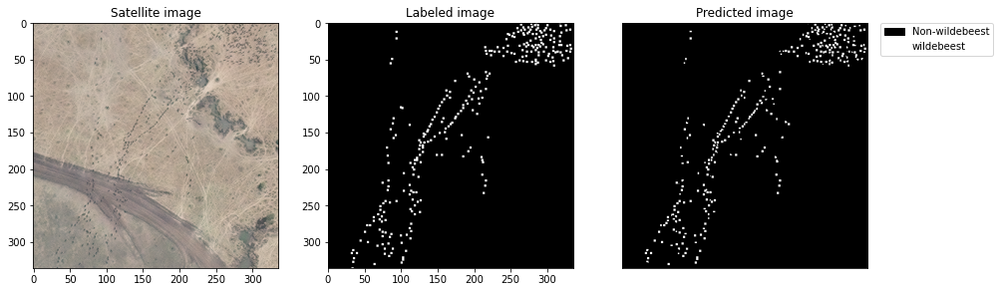

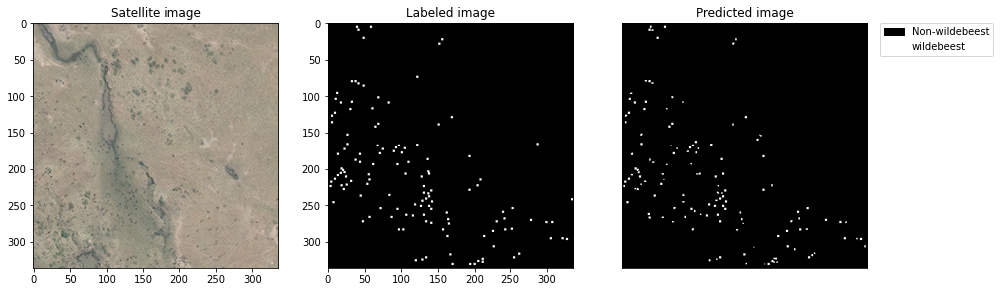

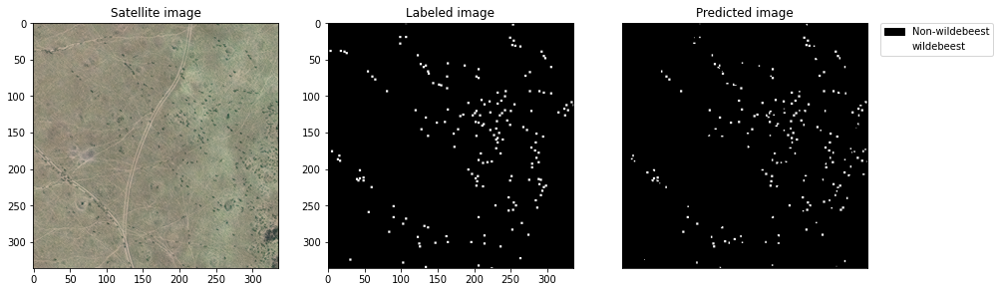

time: 4.35 s (started: 2022-07-25 07:05:00 +00:00)


In [ ]:
Ypredict_int = np.uint8(Ypredict)

for i in range(90,100):
    visualize_predict(Xtest_int[i], Ytest[i], Ypredict_int[i])

###Visualize probability map

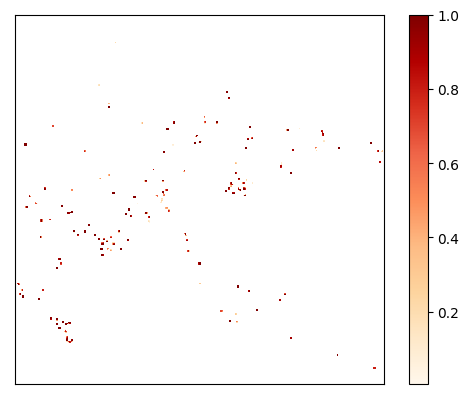

time: 487 ms (started: 2022-07-25 07:29:33 +00:00)


In [ ]:
#choose the prediction of one testing image as a sample to plot the probability map
y1 = predict_float[95,:,:,0]

import matplotlib
import matplotlib.pyplot as plt
import numpy as np

matplotlib.rc_file_defaults()

#mask out the pixels that have a probability lower than 0.005
value = 0.005
data = y1

masked_array = np.ma.masked_where(data < value, data)

#set these masked pixels white
cmap = matplotlib.cm.OrRd  # Can be any colormap that you want after the cm
cmap.set_bad(color='white')

#show the heatmap of wildebeest existence probability
heat = plt.imshow(masked_array, cmap=cmap)
plt.axis('on')
plt.xticks([])
plt.yticks([])
plt.colorbar(heat)

#add the spines on the plot
ax1=plt.gca()
ax1.spines['top'].set_visible(True)
ax1.spines['right'].set_visible(True)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
plt.gcf()

plt.savefig(os.path.join(Data_folder, "data_2009Aug/3_Train_test/test/fig/probability95.png"), bbox_inches="tight")
plt.show()

In [ ]:
!pip install rioxarray
import rioxarray

     |████████████████████████████████| 51kB 2.8MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for rioxarray: filename=rioxarray-0.4.0-cp37-none-any.whl size=51187 sha256=dd32fe57eb0a1d5a7912bbc14b0a8f40cdaac4b1b75f4ccc06931d74d4d855f4
  Stored in directory: /root/.cache/pip/wheels/f9/40/0c/6956ed4ac3ac450f97c248d90cd6135b4ed4042709ddd18605
Successfully built rioxarray
time: 11.2 s (started: 2021-05-21 18:12:11 +00:00)


In [ ]:
tif = rioxarray.open_rasterio(os.path.join(Data_folder, "data_2009Aug/3_Train_test/test/predicted_patch/satellite_patch336_95.tif"))
tif.plot.imshow()

ValueError: ignored

time: 203 ms (started: 2021-05-21 18:13:37 +00:00)


In [ ]:
#write the predicted binary images to tif images that can be opened in GIS software
for i in range(Ypredict.shape[0]):
  image = Ypredict[i]
  writeTiff(image[:,:,0], Ytest_meta[i], wfile = os.path.join(Data_folder, "data_2009Aug/3_Train_test/test/predicted_patch/patch_{}_.tif".format(i)))
  print("Write patch %i to GeoTiff" % i)

Write patch 0 to GeoTiff
Write patch 1 to GeoTiff
Write patch 2 to GeoTiff
Write patch 3 to GeoTiff
Write patch 4 to GeoTiff
Write patch 5 to GeoTiff
Write patch 6 to GeoTiff
Write patch 7 to GeoTiff
Write patch 8 to GeoTiff
Write patch 9 to GeoTiff
Write patch 10 to GeoTiff
Write patch 11 to GeoTiff
Write patch 12 to GeoTiff
Write patch 13 to GeoTiff
Write patch 14 to GeoTiff
Write patch 15 to GeoTiff
Write patch 16 to GeoTiff
Write patch 17 to GeoTiff
Write patch 18 to GeoTiff
Write patch 19 to GeoTiff
Write patch 20 to GeoTiff
Write patch 21 to GeoTiff
Write patch 22 to GeoTiff
Write patch 23 to GeoTiff
Write patch 24 to GeoTiff
Write patch 25 to GeoTiff
Write patch 26 to GeoTiff
Write patch 27 to GeoTiff
Write patch 28 to GeoTiff
Write patch 29 to GeoTiff
Write patch 30 to GeoTiff
Write patch 31 to GeoTiff
Write patch 32 to GeoTiff
Write patch 33 to GeoTiff
Write patch 34 to GeoTiff
Write patch 35 to GeoTiff
Write patch 36 to GeoTiff
Write patch 37 to GeoTiff
Write patch 38 to GeoT

##Threshold analysis

In [ ]:
# calculate the predictions in float datatype ranging between (0,1)
epsilon = 1e-07

# Xtest = Xtest_2009Aug
# Ytest = Ytest_2009Aug
# Ytest_meta = Ytest_meta_2009Aug

# Xtest = Xtest_2010Sep
# Ytest = Ytest_2010Sep
# Ytest_meta = Ytest_meta_2010Sep

# Xtest = Xtest_2013Aug
# Ytest = Ytest_2013Aug
# Ytest_meta = Ytest_meta_2013Aug

# Xtest = Xtest_2015May
# Ytest = Ytest_2015May
# Ytest_meta = Ytest_meta_2015May

# Xtest = Xtest_2018Aug
# Ytest = Ytest_2018Aug
# Ytest_meta = Ytest_meta_2018Aug

# Xtest = Xtest_2020Oct
# Ytest = Ytest_2020Oct
# Ytest_meta = Ytest_meta_2020Oct

Ypredict = [0]
predict_float = [0]
num_folds = 10
weight_set = 0.9
lr_set = 1e-4

for i in range(num_folds):
  fold_no = i+1
  model = unet(pretrained_weights=None, input_size = (PATCHSIZE,PATCHSIZE,NUMBER_BANDS),
               learning_rate = lr_set)
  best_path = os.path.join(Folder, 'tmp/pretrained_weights/best_weights_fold_{}.hdf5'.format(fold_no))
  model.load_weights(best_path)
  predict = model.predict(Xtest)
  predict = (predict-np.min(predict))/(np.max(predict)-np.min(predict))
  numpy.save(os.path.join(Folder, 'tmp/pretrained_weights/predict_fold_{}.npy'.format(fold_no)), predict, allow_pickle=True, fix_imports=True)
  Ypredict = Ypredict + predict/num_folds
  predict_float = predict_float + predict/num_folds
    
del model

numpy.save(os.path.join(Folder, 'tmp/pretrained_weights/predict_average.npy'), predict_float, allow_pickle=True, fix_imports=True)


time: 13min 19s (started: 2022-02-16 15:09:56 -00:00)


In [ ]:
import pandas as pd
threshold = []
precision_curve = []
recall_curve = []
f1_curve = []

fold_no = 10

#try different threshold and calculate corresponding accuracy
for t in range(1, 100, 1):
  t = np.float(t)/100
  threshold.append(t)
#   Ypredict = numpy.load(os.path.join(Folder, 'tmp/pretrained_weights/predict_fold_{}.npy'.format(fold_no)))
  Ypredict = numpy.load(os.path.join(Folder, 'tmp/pretrained_weights/predict_average.npy'))
  Ypredict[Ypredict>t]=1.0
  Ypredict[Ypredict<=t]=0.0
  accuracy_curve = dataset_evaluation(Ypredict, Ytest, Ytest_meta)
  precision_curve.append(accuracy_curve['Precision'])
  recall_curve.append(accuracy_curve['Recall'])
  f1_curve.append(accuracy_curve['F1'])
  print(t)

threshold.append(0)
precision_curve.append(0)
recall_curve.append(1)
f1_curve.append(0)

threshold.append(1)
precision_curve.append(1)
recall_curve.append(0)
f1_curve.append(0)
#Save the results
curve = {}
curve['threshold'] = threshold
curve['precision'] = precision_curve
curve['recall'] = recall_curve
curve['f1'] = f1_curve
results = pd.DataFrame(curve)
print(results)
# results.to_csv(os.path.join(Folder, 'tmp/pretrained_weights/PR_fold_{}.csv'.format(fold_no)), index = False) 
results.to_csv(os.path.join(Folder, 'tmp/pretrained_weights/PR_average.csv'), index = False) 

Wildebeest-level accuracy: on testing dataset  
Total TP:  10875
Total FP:  8025
Total FN:  719
Precision:  0.5753968253968254
Recall:  0.937985164740383
F1-score:  0.7132550194405992
0.01
Wildebeest-level accuracy: on testing dataset  
Total TP:  10845
Total FP:  7832
Total FN:  749
Precision:  0.5806607056807839
Recall:  0.9353976194583405
F1-score:  0.71652732216697
0.02
Wildebeest-level accuracy: on testing dataset  
Total TP:  10835
Total FP:  7687
Total FN:  759
Precision:  0.5849800237555339
Recall:  0.9345351043643264
F1-score:  0.7195510218451081
0.03
Wildebeest-level accuracy: on testing dataset  
Total TP:  10836
Total FP:  7589
Total FN:  758
Precision:  0.5881139755766621
Recall:  0.9346213558737277
F1-score:  0.7219427221683535
0.04
Wildebeest-level accuracy: on testing dataset  
Total TP:  10829
Total FP:  7498
Total FN:  765
Precision:  0.5908768483657991
Recall:  0.9340175953079178
F1-score:  0.7238393964006905
0.05
Wildebeest-level accuracy: on testing dataset  
Total

Wildebeest-level accuracy: on testing dataset  
Total TP:  9534
Total FP:  1865
Total FN:  2060
Precision:  0.8363891569435915
Recall:  0.822321890633086
F1-score:  0.8292958226604947
0.45
Wildebeest-level accuracy: on testing dataset  
Total TP:  9524
Total FP:  1846
Total FN:  2070
Precision:  0.8376429199648197
Recall:  0.8214593755390719
F1-score:  0.8294721673884915
0.46
Wildebeest-level accuracy: on testing dataset  
Total TP:  9498
Total FP:  1843
Total FN:  2096
Precision:  0.8374922846309849
Recall:  0.8192168362946352
F1-score:  0.8282537106339487
0.47
Wildebeest-level accuracy: on testing dataset  
Total TP:  9480
Total FP:  1831
Total FN:  2114
Precision:  0.8381221819467775
Recall:  0.8176643091254097
F1-score:  0.8277668131379566
0.48
Wildebeest-level accuracy: on testing dataset  
Total TP:  9470
Total FP:  1794
Total FN:  2124
Precision:  0.8407315340909091
Recall:  0.8168017940313955
F1-score:  0.8285938777381345
0.49
Wildebeest-level accuracy: on testing dataset  
Tot

Wildebeest-level accuracy: on testing dataset  
Total TP:  6946
Total FP:  662
Total FN:  4648
Precision:  0.9129863301787592
Recall:  0.5991029843022253
F1-score:  0.7234662577476962
0.89
Wildebeest-level accuracy: on testing dataset  
Total TP:  6589
Total FP:  578
Total FN:  5005
Precision:  0.9193525882517092
Recall:  0.5683111954459203
F1-score:  0.7024145362284328
0.9
Wildebeest-level accuracy: on testing dataset  
Total TP:  5740
Total FP:  445
Total FN:  5854
Precision:  0.9280517380759903
Recall:  0.49508366396411935
F1-score:  0.6457055623674279
0.91
Wildebeest-level accuracy: on testing dataset  
Total TP:  5720
Total FP:  428
Total FN:  5874
Precision:  0.9303838646714379
Recall:  0.49335863377609107
F1-score:  0.6447976099923328
0.92
Wildebeest-level accuracy: on testing dataset  
Total TP:  5692
Total FP:  422
Total FN:  5902
Precision:  0.9309780830879948
Recall:  0.4909435915128515
F1-score:  0.642873232403059
0.93
Wildebeest-level accuracy: on testing dataset  
Total T

###Plot precision-recall curve

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


%matplotlib inline
sns.set_theme()
sns.set_style('white')
sns.set_style("ticks")

plt.rcParams["figure.figsize"] = (4,4)

time: 47.6 ms (started: 2022-07-26 03:57:25 +00:00)


In [14]:
# d = pd.read_csv(os.path.join(Data_folder, "tmp/RGB_parameter_tuning/precision_recall_{}.csv".format(weight_set))) 
d = pd.read_csv(os.path.join(Folder, 'tmp/pretrained_weights/PR_average.csv'))

d = d.sort_values(by='recall')
#calculate the Area Under precision-recall Curve
auc = np.trapz(y=d['precision'], x=d['recall'])
#add AUC to the data
d = d.assign(AUC=auc)

print('AUC=',np.trapz(y=d['precision'], x=d['recall']))
#add the weight to the data
d = d.assign(fold=0)

#save data as csv
d.to_csv(os.path.join(Folder, 'tmp/pretrained_weights/PR_average.csv'))

AUC= 0.8758856958916172
time: 743 ms (started: 2022-07-26 03:57:31 +00:00)


In [ ]:

# fold_no = 1
# d = pd.read_csv(os.path.join(Folder, 'tmp/pretrained_weights/PR_fold_{}.csv'.format(fold_no)))

# for fold_no in range(2, 11):
#   di = pd.read_csv(os.path.join(Folder, 'tmp/pretrained_weights/PR_fold_{}.csv'.format(fold_no)))
#   d = d.append(di)

# d = d.assign(model_type='sub model')
# #save data as csv
# d.to_csv(os.path.join(Folder, 'tmp/pretrained_weights/PR_subModel.csv')) 

time: 734 ms (started: 2022-02-18 14:26:04 -00:00)


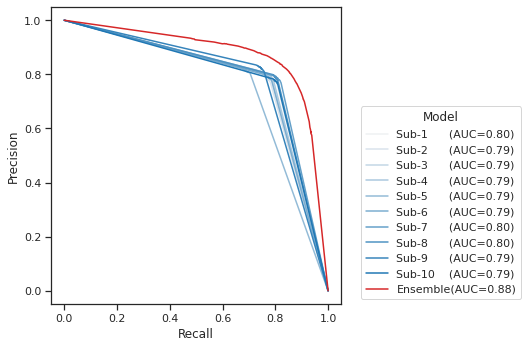

time: 8.12 s (started: 2022-07-26 04:04:49 +00:00)


In [19]:

#PLOT the precision-recall curve for k-fold ensemble model

d = pd.read_csv(os.path.join(Folder, 'tmp/pretrained_weights/PR_subModel.csv'))

palette = sns.light_palette("tab:blue", n_colors=10)
g = sns.relplot(x='recall', y='precision',data=d, kind='line', sort=True, hue='fold',palette=palette, legend=False, facet_kws=dict(despine=False))

d9 = pd.read_csv(os.path.join(Folder, 'tmp/pretrained_weights/PR_average.csv'))
plt.plot(d9['recall'], d9['precision'], color='tab:red', zorder=11)

plt.legend(['Sub-1      (AUC=0.80)','Sub-2      (AUC=0.79)','Sub-3      (AUC=0.79)','Sub-4      (AUC=0.79)','Sub-5      (AUC=0.79)',
                         'Sub-6      (AUC=0.79)','Sub-7      (AUC=0.80)','Sub-8      (AUC=0.80)','Sub-9      (AUC=0.79)','Sub-10    (AUC=0.79)',
            'Ensemble(AUC=0.88)'],
           bbox_to_anchor=(1.05, 0), loc='lower left', title='Model')

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.savefig(os.path.join(Folder, 'tmp/pretrained_weights/PR_Model.png'), bbox_inches="tight", dpi=400)

plt.show()

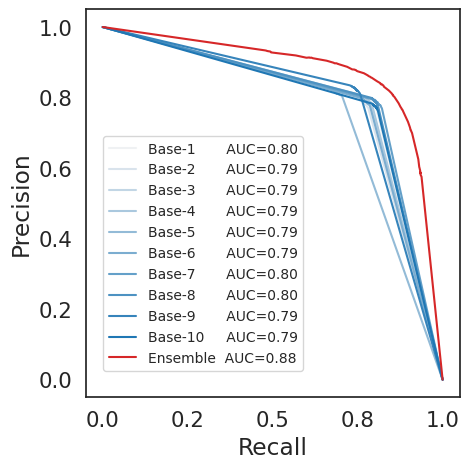

time: 4.19 s (started: 2022-07-26 04:34:12 +00:00)


In [24]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

d = pd.read_csv(os.path.join(Folder, 'tmp/pretrained_weights/PR_subModel.csv'))
sns.set(rc = {'figure.figsize':(6,4)}, font_scale = 1.4)
sns.set_style('white')

palette = sns.light_palette("tab:blue", n_colors=10)
g = sns.relplot(x='recall', y='precision',data=d, kind='line', sort=True, hue='fold',palette=palette, legend=False, facet_kws=dict(despine=False))

d9 = pd.read_csv(os.path.join(Folder, 'tmp/pretrained_weights/PR_average.csv'))

plt.plot(d9['recall'], d9['precision'], color='tab:red', zorder=11)

from matplotlib.ticker import StrMethodFormatter
# plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}')) # No decimal places
plt.gca().xaxis.set_major_formatter(StrMethodFormatter('{x:,.1f}')) 

plt.legend(['Base-1       AUC=0.80','Base-2       AUC=0.79','Base-3       AUC=0.79','Base-4       AUC=0.79','Base-5       AUC=0.79',
                         'Base-6       AUC=0.79','Base-7       AUC=0.80','Base-8       AUC=0.80','Base-9       AUC=0.79','Base-10     AUC=0.79',
            'Ensemble  AUC=0.88'],
          #  bbox_to_anchor=(1.95, -0.022), loc='lower right',fontsize = 8, title='Model')
            bbox_to_anchor=(0.6, 0.05), loc='lower right',fontsize = 10)
plt.xlabel("Recall")
plt.ylabel("Precision")

from matplotlib.ticker import StrMethodFormatter
# plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}')) # No decimal places
plt.gca().xaxis.set_major_formatter(StrMethodFormatter('{x:,.1f}')) 

# plt.savefig("/content/MyDrive/MyDrive/Colab/plot/PR_Model_smooth.png", bbox_inches="tight", dpi=400)

plt.show()

###Parameter tuning using precision-recall curve

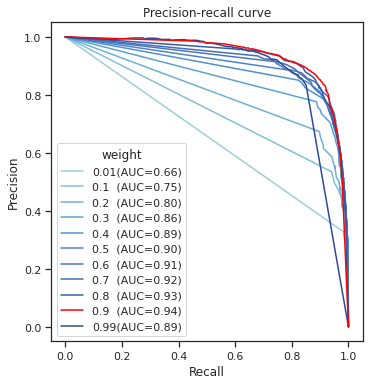

time: 1.34 s (started: 2021-04-15 22:39:03 +00:00)


In [ ]:
custom_p = ['#9ccdd9']
sns.set_palette(custom_p)


d = pd.read_csv(os.path.join(Folder, "tmp/parameter_tuning/pr_total.csv"))
d0 = d.query('weight==0.01')
g = sns.relplot(x='recall', y='precision',data=d0, kind='line', sort=True, legend=False, facet_kws=dict(despine=False))

d1 = d.query('weight==0.1')
plt.plot(d1['recall'], d1['precision'], color='#82bfd6')

d2 = d.query('weight==0.2')
plt.plot(d2['recall'], d2['precision'], color='#6cb0d3')

d2 = d.query('weight==0.3')
plt.plot(d2['recall'], d2['precision'], color='#59a1d0')

d2 = d.query('weight==0.4')
plt.plot(d2['recall'], d2['precision'], color='#4f90cc')

d2 = d.query('weight==0.5')
plt.plot(d2['recall'], d2['precision'], color='#4a84c6')

d2 = d.query('weight==0.6')
plt.plot(d2['recall'], d2['precision'], color='#4778bf')

d2 = d.query('weight==0.7')
plt.plot(d2['recall'], d2['precision'], color='#476cb7')

d1 = pd.read_csv(os.path.join(Folder, "tmp/parameter_tuning/pr_weight_0.9.csv"))
plt.plot(d1['recall'], d1['precision'], color='#395aa7')

d2 = d.query('weight==0.9')
plt.plot(d2['recall'], d2['precision'], color='red', zorder=12)

d2 = d.query('weight==0.99')
plt.plot(d2['recall'], d2['precision'], color='#2c4996')

plt.legend(['0.01(AUC=0.66)','0.1  (AUC=0.75)','0.2  (AUC=0.80)','0.3  (AUC=0.86)','0.4  (AUC=0.89)',
                         '0.5  (AUC=0.90)','0.6  (AUC=0.91)','0.7  (AUC=0.92)','0.8  (AUC=0.93)','0.9  (AUC=0.94)','0.99(AUC=0.89)'],
           loc=3, title='weight')

plt.title('Precision-recall curve')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.show()

##Search radius sensitivity analysis
######When we determine the accuracy of one predicted point, we use a parameter: search radius. 
######To find the best searching radius, we conduct a sensitivity analysis for the search radius to evaluate its effect on accuracy.

In [ ]:
Total_precision = []
Total_recall = []
Total_f1 = []
distance = []

#try different distance and evaluate the accuracy
for dist in range(0,100,1):
  dist = np.float(dist)/100
  distance.append(dist)

  print("Search radius: ", dist)
  Ypredict = numpy.load(os.path.join(Folder, 'tmp/pretrained_weights/predict_average.npy'))
  Ypredict[Ypredict>0.5]=1.0
  Ypredict[Ypredict<=0.5]=0.0
  dic= dataset_evaluation(Ypredict, Ytest, Ytest_meta, search_distance = dist)

  Total_precision.append(dic['Precision'])
  Total_recall.append(dic['Recall'])
  Total_f1.append(dic['F1'])

Search distance:  0.0
ERROR! Session/line number was not unique in database. History logging moved to new session 1189
Wildebeest-level accuracy: on testing dataset  
Total TP:  0
Total FP:  11063
Total FN:  11594
Precision:  0.0
Recall:  0.0
F1-score:  0.0
Search distance:  0.01
Wildebeest-level accuracy: on testing dataset  
Total TP:  6731
Total FP:  4332
Total FN:  4863
Precision:  0.6084244779896953
Recall:  0.5805589097809212
F1-score:  0.5941651086980771
Search distance:  0.02
Wildebeest-level accuracy: on testing dataset  
Total TP:  6729
Total FP:  4334
Total FN:  4865
Precision:  0.6082436952002169
Recall:  0.5803864067621184
F1-score:  0.5939885628182165
Search distance:  0.03
Wildebeest-level accuracy: on testing dataset  
Total TP:  6729
Total FP:  4334
Total FN:  4865
Precision:  0.6082436952002169
Recall:  0.5803864067621184
F1-score:  0.5939885628182165
Search distance:  0.04
Wildebeest-level accuracy: on testing dataset  
Total TP:  6729
Total FP:  4334
Total FN:  4865

Wildebeest-level accuracy: on testing dataset  
Total TP:  6928
Total FP:  4135
Total FN:  4666
Precision:  0.6262315827533219
Recall:  0.5975504571329998
F1-score:  0.611554877864339
Search distance:  0.41
Wildebeest-level accuracy: on testing dataset  
Total TP:  6921
Total FP:  4142
Total FN:  4673
Precision:  0.6255988429901473
Recall:  0.5969466965671899
F1-score:  0.6109369672848272
Search distance:  0.42
Wildebeest-level accuracy: on testing dataset  
Total TP:  6939
Total FP:  4124
Total FN:  4655
Precision:  0.6272258880954533
Recall:  0.5984992237364154
F1-score:  0.6125258802035719
Search distance:  0.43
Wildebeest-level accuracy: on testing dataset  
Total TP:  7409
Total FP:  3654
Total FN:  4185
Precision:  0.6697098436228871
Recall:  0.6390374331550802
F1-score:  0.654014161970796
Search distance:  0.44
Wildebeest-level accuracy: on testing dataset  
Total TP:  7575
Total FP:  3488
Total FN:  4019
Precision:  0.6847148151495978
Recall:  0.653355183715715
F1-score:  0.668

Wildebeest-level accuracy: on testing dataset  
Total TP:  9607
Total FP:  1456
Total FN:  1987
Precision:  0.8683901292596945
Recall:  0.8286182508193893
F1-score:  0.8480380839375162
Search distance:  0.81
Wildebeest-level accuracy: on testing dataset  
Total TP:  9605
Total FP:  1458
Total FN:  1989
Precision:  0.8682093464702161
Recall:  0.8284457478005866
F1-score:  0.8478615380576557
Search distance:  0.82
Wildebeest-level accuracy: on testing dataset  
Total TP:  9606
Total FP:  1457
Total FN:  1988
Precision:  0.8682997378649553
Recall:  0.8285319993099879
F1-score:  0.8479498109975858
Search distance:  0.83
Wildebeest-level accuracy: on testing dataset  
Total TP:  9608
Total FP:  1455
Total FN:  1986
Precision:  0.8684805206544337
Recall:  0.8287045023287908
F1-score:  0.8481263568774465
Search distance:  0.84
Wildebeest-level accuracy: on testing dataset  
Total TP:  9607
Total FP:  1456
Total FN:  1987
Precision:  0.8683901292596945
Recall:  0.8286182508193893
F1-score:  0.

In [ ]:
dic={}
dic['distance'] = distance
dic['precision'] = Total_precision
dic['recall'] = Total_recall
dic['f1'] = Total_f1
results = pd.DataFrame(dic)
# Export as csv
results.to_csv(os.path.join(Folder, "tmp/pretrained_weights/search_distance.csv"), index = False)

time: 78 ms (started: 2022-07-03 14:34:55 -00:00)


In [20]:
d = pd.read_csv(os.path.join(Folder, "tmp/pretrained_weights/search_distance.csv"))
print(d)

    distance  precision    recall        f1
0       0.01   0.608424  0.580559  0.594165
1       0.02   0.608244  0.580386  0.593989
2       0.03   0.608244  0.580386  0.593989
3       0.04   0.608244  0.580386  0.593989
4       0.05   0.608605  0.580731  0.594342
..       ...        ...       ...       ...
94      0.95   0.868661  0.828877  0.848303
95      0.96   0.868842  0.829050  0.848479
96      0.97   0.868752  0.828963  0.848391
97      0.98   0.868842  0.829050  0.848479
98      0.99   0.868932  0.829136  0.848568

[99 rows x 4 columns]
time: 422 ms (started: 2022-07-26 04:15:53 +00:00)


In [21]:
distance = d['distance'].to_list()
precision = d['precision'].to_list()
recall = d['recall'].to_list()
f1 = d['f1'].to_list()

time: 2.07 ms (started: 2022-07-26 04:15:57 +00:00)


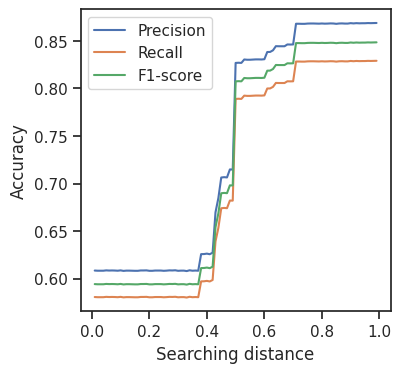

time: 161 ms (started: 2022-07-26 04:16:03 +00:00)


In [22]:
figure(figsize=(4, 4), dpi=100)
plt.plot(distance, precision, label='Precision')
plt.plot(distance, recall, label='Recall')
plt.plot(distance, f1, label='F1-score')
plt.xlabel('Searching distance')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

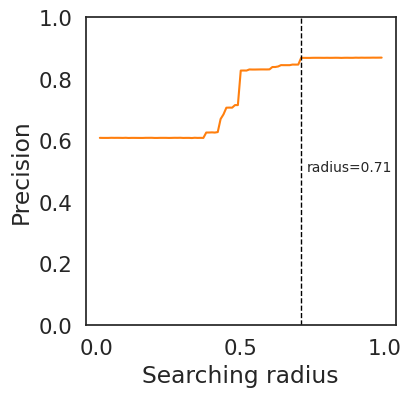

<Figure size 400x400 with 0 Axes>

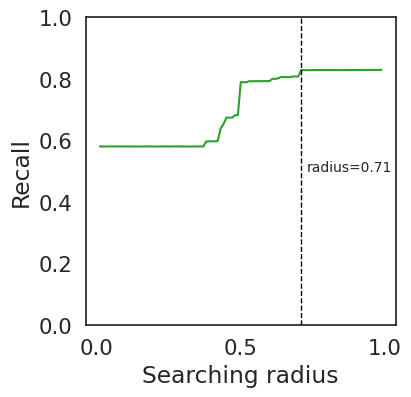

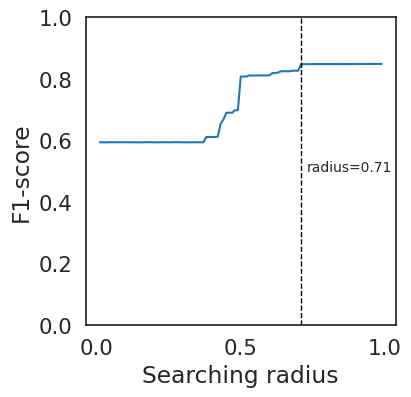

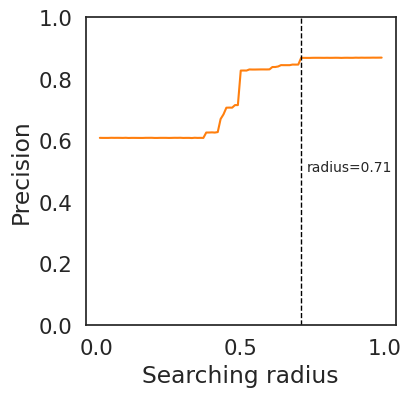

time: 3.55 s (started: 2022-07-26 04:42:29 +00:00)


In [27]:
# plot the accuracy under different distance
matplotlib.rc('font', size=10)
plt.rcParams["figure.figsize"] = (4,4)


figure(figsize=(4, 4), dpi=100)
plt.plot(distance, precision, color='tab:orange',label='Precision')
plt.xlabel('Searching radius')
plt.ylabel('Precision')
#plt.legend()
plt.axvline(x=0.71, color='black', linestyle="--", linewidth=1, ymin=0, ymax=1)
plt.annotate('radius=0.71',xy=(0.73, 0.5))
ax1=plt.gca()
figure(figsize=(4, 4), dpi=100)
ax1.spines['top'].set_visible(True)
ax1.spines['right'].set_visible(True)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.set_ylim([0, 1])

plt.savefig(os.path.join(Folder, "tmp/pretrained_weights/precision_sensitivity.png"), bbox_inches="tight",dpi=400)
plt.show()

figure(figsize=(4, 4), dpi=100)
plt.plot(distance, recall, color='tab:green',label='Recall')
plt.xlabel('Searching radius')
plt.ylabel('Recall')
#plt.legend()
plt.axvline(x=0.71, color='black', linestyle="--", linewidth=1, ymin=0, ymax=1)
plt.annotate('radius=0.71',xy=(0.73, 0.5))
ax1=plt.gca()
ax1.spines['top'].set_visible(True)
ax1.spines['right'].set_visible(True)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.set_ylim([0,1])
plt.savefig(os.path.join(Folder, "tmp/pretrained_weights/recall_sensitivity.png"), bbox_inches="tight",dpi=400)
plt.show()

figure(figsize=(4, 4), dpi=100)
plt.plot(distance, f1, color='tab:blue',label='F1-score')
plt.xlabel('Searching radius')
plt.ylabel('F1-score')
#plt.legend()
plt.axvline(x=0.71, color='black', linestyle="--", linewidth=1, ymin=0, ymax=1)
plt.annotate('radius=0.71',xy=(0.73, 0.5))
#plt.title("F1 - searching distance ")
plt.gcf()
ax1=plt.gca()
ax1.spines['top'].set_visible(True)
ax1.spines['right'].set_visible(True)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.set_ylim([0,1])

plt.savefig(os.path.join(Folder, "tmp/pretrained_weights/f1_sensitivity.png"), bbox_inches="tight",dpi=400)
plt.show()


figure(figsize=(4, 4), dpi=100)
plt.plot(distance, precision, color='tab:orange',label='Precision')
plt.xlabel('Searching radius')
plt.ylabel('Precision')
#plt.legend()
plt.axvline(x=0.71, color='black', linestyle="--", linewidth=1, ymin=0, ymax=1)
plt.annotate('radius=0.71',xy=(0.73, 0.5))
ax1=plt.gca()
ax1.spines['top'].set_visible(True)
ax1.spines['right'].set_visible(True)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.set_ylim([0,1])
plt.savefig(os.path.join(Folder, "tmp/pretrained_weights/pre_sensitivity.png"), bbox_inches="tight",dpi=400)
plt.show()

#References
***References***

Ankit. (2020). ankitkariryaa/An-unexpectedly-large-count-of-trees-in-the-western-Sahara-and-Sahel: Paper version (v1.0.0). Zenodo. https://doi.org/10.5281/zenodo.3978185